# **COMBINED ASSIGNMENT**


### DATASET EXPLANATION:

 Uploading the Bank Management Data set, The Dataset can be described as below.

Input variables:

Bank client data:

1 - age (numeric)

2 - job : type of job (categorical: 'admin.','blue-collar','entrepreneur','housemaid','management','retired','self-employed','services','student','technician','unemployed','unknown')

3 - marital : marital status (categorical: 'divorced','married','single','unknown'; note: 'divorced' means divorced or widowed)

4 - education (categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','unknown')

5 - default: has credit in default? (categorical: 'no','yes','unknown')

6 - housing: has housing loan? (categorical: 'no','yes','unknown')

7 - loan: has personal loan? (categorical: 'no','yes','unknown')

Related with the last contact of the current campaign:

8 - contact: contact communication type (categorical: 'cellular','telephone')

9 - month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')

10 - day_of_week: last contact day of the week (categorical: 'mon','tue','wed','thu','fri')

11 - duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.

Other attributes:

12 - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)

13 - pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)

14 - previous: number of contacts performed before this campaign and for this client (numeric)

15 - poutcome: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success')

Social and economic context attributes

16 - emp.var.rate: employment variation rate - quarterly indicator (numeric)

17 - cons.price.idx: consumer price index - monthly indicator (numeric)

18 - cons.conf.idx: consumer confidence index - monthly indicator (numeric)

19 - euribor3m: euribor 3 month rate - daily indicator (numeric)

20 - nr.employed: number of employees - quarterly indicator (numeric)

Output variable (desired target):

21 - y - has the client subscribed a term deposit? (binary: 'yes','no')

So there are total 21 columns and 41188 rows(data entries) in the choosen dataset.

In [ ]:
!pip install eli5

In [ ]:
import numpy as np
import matplotlib as mlt
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd

from sklearn import tree
import sklearn.metrics as sm
import warnings
warnings.filterwarnings("ignore")

Uploading the Bank Management Data set, The Dataset can be described as below.

Input variables:

Bank client data:

1 - age (numeric)

2 - job : type of job (categorical: 'admin.','blue-collar','entrepreneur','housemaid','management','retired','self-employed','services','student','technician','unemployed','unknown')

3 - marital : marital status (categorical: 'divorced','married','single','unknown'; note: 'divorced' means divorced or widowed)

4 - education (categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','unknown')

5 - default: has credit in default? (categorical: 'no','yes','unknown')

6 - housing: has housing loan? (categorical: 'no','yes','unknown')

7 - loan: has personal loan? (categorical: 'no','yes','unknown')

Related with the last contact of the current campaign:

8 - contact: contact communication type (categorical: 'cellular','telephone')

9 - month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')

10 - day_of_week: last contact day of the week (categorical: 'mon','tue','wed','thu','fri')

11 - duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.

Other attributes:

12 - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)

13 - pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)

14 - previous: number of contacts performed before this campaign and for this client (numeric)

15 - poutcome: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success')

Social and economic context attributes

16 - emp.var.rate: employment variation rate - quarterly indicator (numeric)

17 - cons.price.idx: consumer price index - monthly indicator (numeric)

18 - cons.conf.idx: consumer confidence index - monthly indicator (numeric)

19 - euribor3m: euribor 3 month rate - daily indicator (numeric)

20 - nr.employed: number of employees - quarterly indicator (numeric)

Output variable (desired target):

21 - y - has the client subscribed a term deposit? (binary: 'yes','no')

So there are total 21 columns and 41188 rows(data entries) in the choosen dataset.

In [ ]:
import seaborn as sns
url = 'https://raw.githubusercontent.com/yugakanse/Assignment-Combine-Data-Cleaning-Feature-Selection-Modeling-and-Interpretability-into-one-report/main/bank-additional-full.csv'

df = pd.read_csv(url, sep=';')
df2 = pd.read_csv(url, sep=';')
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


The read_csv() is a function in pandas library that is used to read a CSV file and create a dataframe from it


In [ ]:
#we will check the data types

df.dtypes

age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
duration            int64
campaign            int64
pdays               int64
previous            int64
poutcome           object
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
y                  object
dtype: object

In [ ]:
numeric_columns = df.select_dtypes(exclude=['object']).columns.tolist()
categorical_columns = df.select_dtypes(include=['object']).columns.tolist()

In [ ]:
#Printing the list of categorical and numerical columns

print(" Categorical Variables are:                ")
for row,col in enumerate(categorical_columns):
    print(f'{row+1}. {col}')
print("\n")
print("Numerical Variables are:                 ")
for row,col in enumerate(numeric_columns):
    print(f'{row+1}. {col}')

 Categorical Variables are:                
1. job
2. marital
3. education
4. default
5. housing
6. loan
7. contact
8. month
9. day_of_week
10. poutcome
11. y


Numerical Variables are:                 
1. age
2. duration
3. campaign
4. pdays
5. previous
6. emp.var.rate
7. cons.price.idx
8. cons.conf.idx
9. euribor3m
10. nr.employed


Q2. ARE THERE ANY MISSING VALUES?

In [ ]:
df.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

our dataset does not have any null values. Now we will check for naN

In [ ]:
df.isna().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

So we do not have any missing values in our dependent as well as independent variables

In [ ]:
df = df.drop_duplicates()

# **HeatMap**

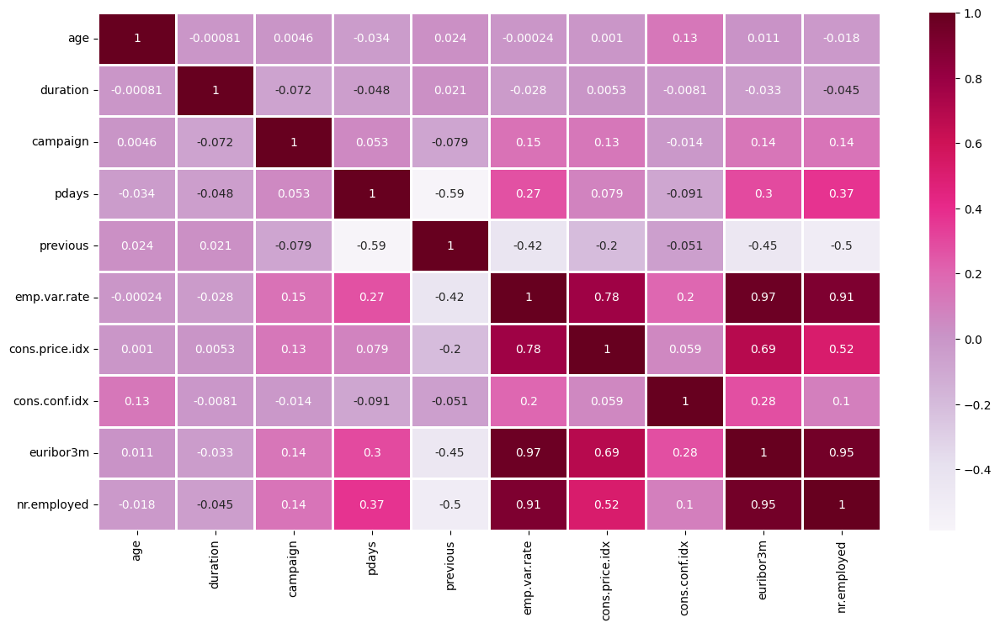

In [ ]:
import matplotlib.pyplot as plt
# Create a figure with a specified size
fig, ay = plt.subplots(figsize=(15, 8))

# Generate the heatmap
sns.heatmap(df.corr(), linewidths=0.9, annot=True, ax=ay, cmap='PuRd')

# Show the plot
plt.show()

The correlation heatmap shows that there is very little to no correlation between the independent variables. This suggests that each variable is independent of the others. The closer the values are to 1 and -1, the stronger the positive or negative correlation between two features.





# **Pairplot**

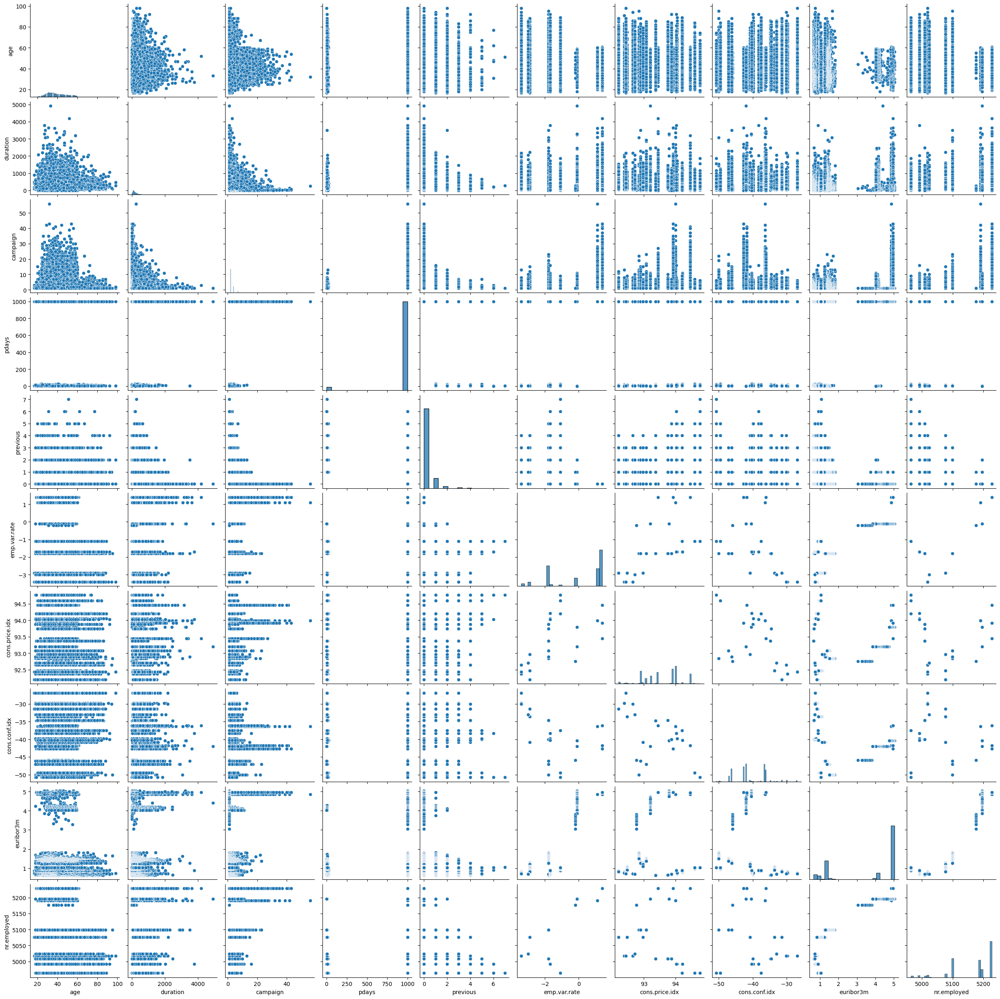

In [ ]:
sns.pairplot(
    df
)

From the above, we can say that we have a column age, the histogram plot shows how frequently each age occurs in the dataset. The x-axis shows the range of ages, and the y-axis shows the frequency of each age in the dataset.

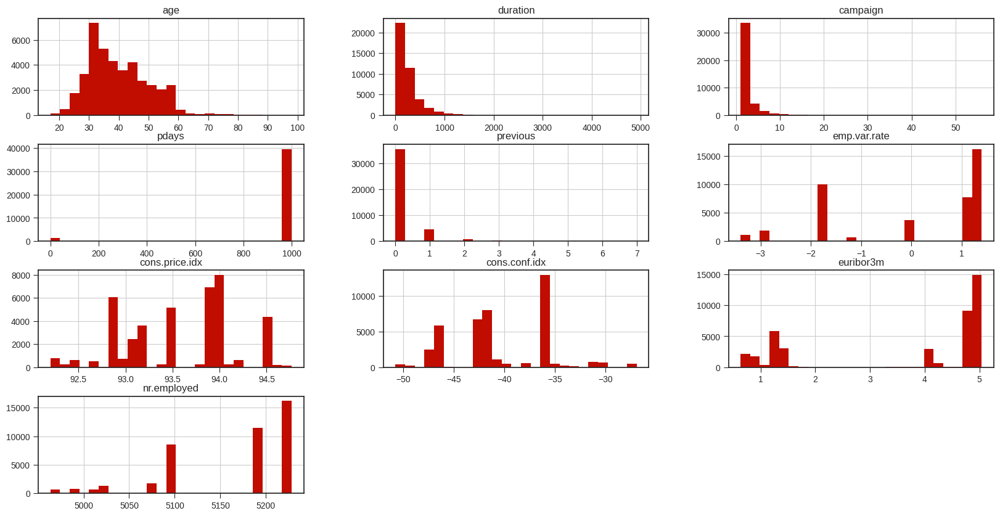

In [ ]:
plt.style.use('seaborn-ticks')

df.hist(bins=25, figsize=(20,10), color='#c00d00')
plt.show();

Q3. For the likely distribution of numeric variables

<Figure size 800x500 with 0 Axes>

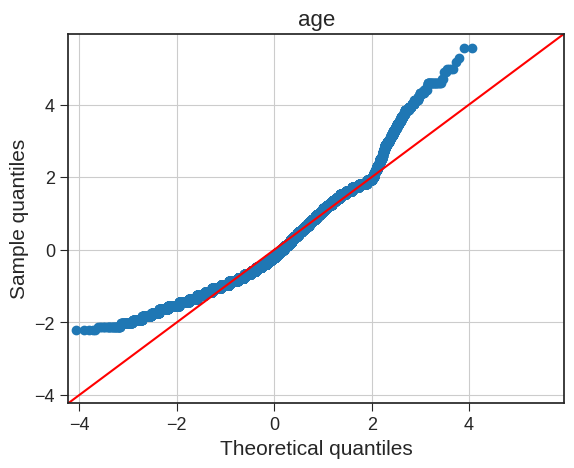

<Figure size 800x500 with 0 Axes>

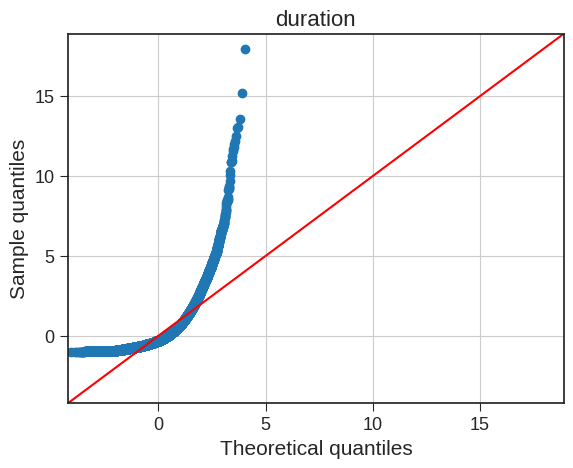

<Figure size 800x500 with 0 Axes>

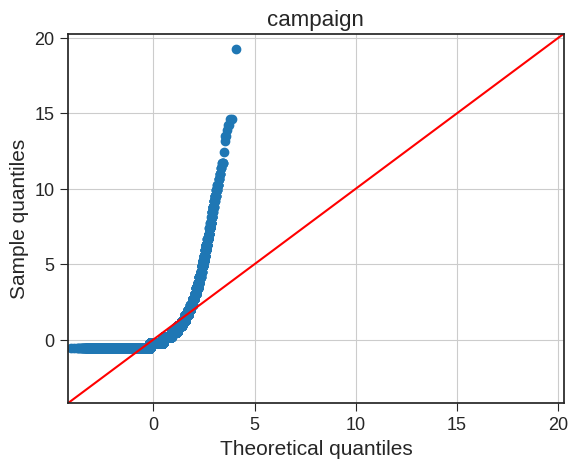

<Figure size 800x500 with 0 Axes>

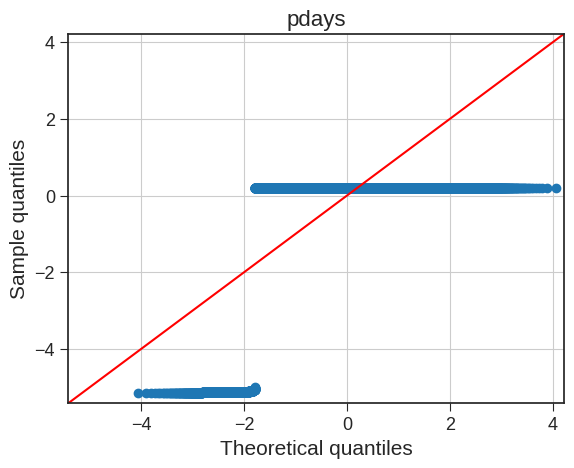

<Figure size 800x500 with 0 Axes>

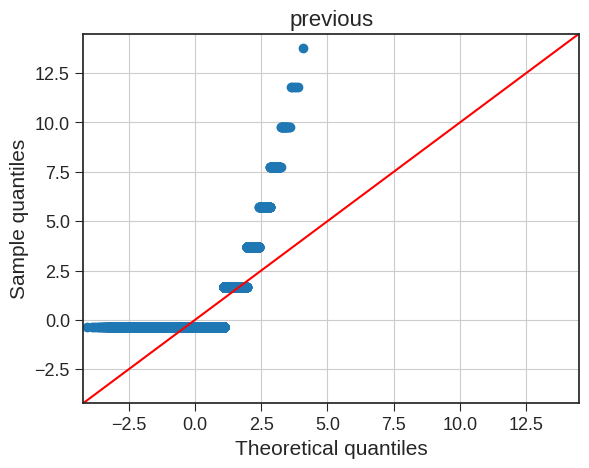

<Figure size 800x500 with 0 Axes>

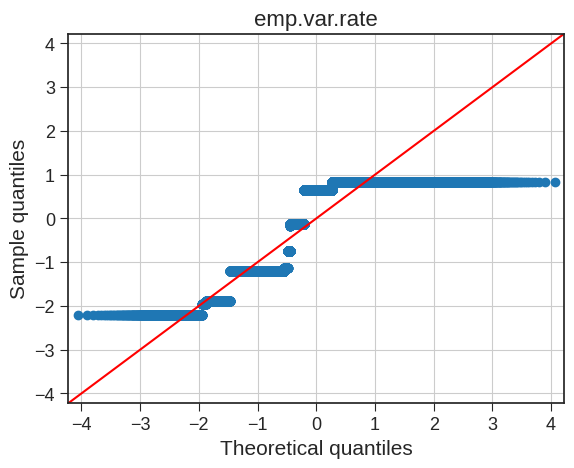

<Figure size 800x500 with 0 Axes>

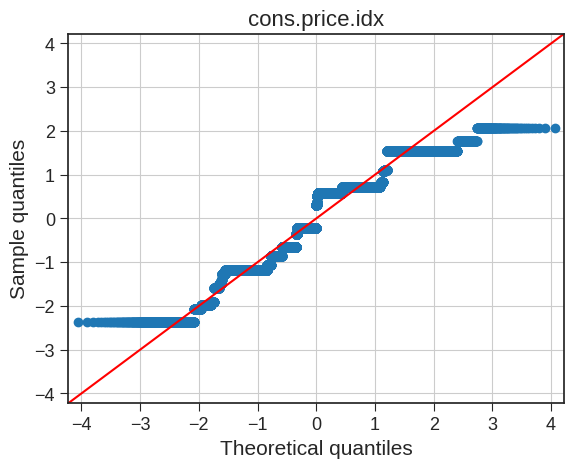

<Figure size 800x500 with 0 Axes>

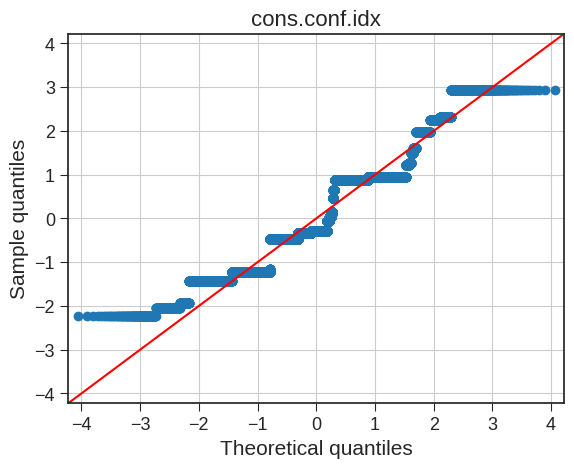

<Figure size 800x500 with 0 Axes>

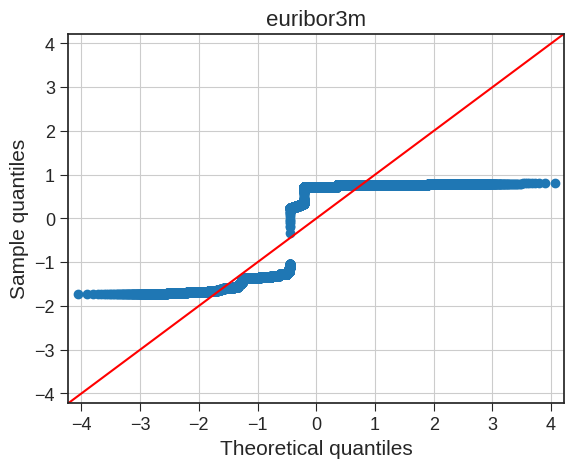

<Figure size 800x500 with 0 Axes>

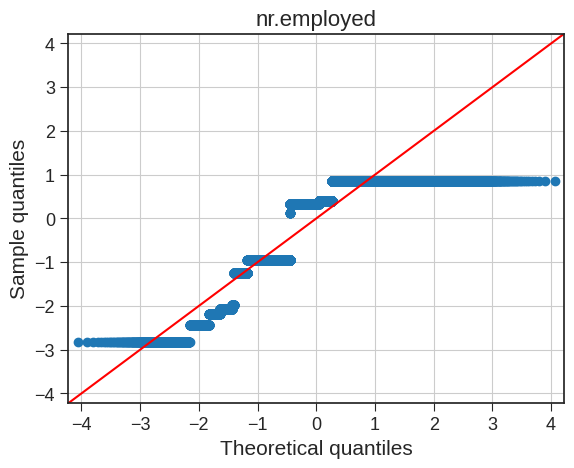

In [ ]:
# From above we can observe the likely distributions of all the numeric variable
from sklearn.linear_model import Lasso
import matplotlib.pyplot as plt
from statsmodels.graphics.gofplots import qqplot



# Check normality of independent variables
data_norm=df[['age','duration','campaign','pdays','previous','emp.var.rate','cons.price.idx',
                'cons.conf.idx','euribor3m','nr.employed']]


for c in data_norm.columns[:]:
  plt.figure(figsize=(8,5))
  fig=qqplot(data_norm[c],line='45',fit='True')
  plt.xticks(fontsize=13)
  plt.yticks(fontsize=13)
  plt.xlabel("Theoretical quantiles",fontsize=15)
  plt.ylabel("Sample quantiles",fontsize=15)
  plt.title("{}".format(c),fontsize=16)
  plt.grid(True)
  plt.show()

  #Age has somewhat normal distribution

From the above, it is clear that age has somewhat normal distribution

**Which independent variables are useful to predict a target (dependent variable)? (Use at least three methods)**

**METHOD 1: By using SelectKBest method**

In [ ]:
#First we will normalize the data
# Create Dummies
data = pd.get_dummies(df)

# Normalizing the data in the columns beacuse some values are too high when compared to other independent variable
from sklearn import preprocessing

# Create x to store scaled values as floats. (between 0-1)
#Here we are not normalizing the categorical variables since there values are 0 or 1 already.

x = data[['age','duration','campaign','pdays','previous','emp.var.rate','cons.price.idx','cons.conf.idx','euribor3m','nr.employed']].values.astype(float)

# Preparing for normalizing
min_max_scaler = preprocessing.MinMaxScaler()

# Transform the data to fit minmax processor
x_scaled = min_max_scaler.fit_transform(x)

# Run the normalizer on the dataframe
data[['age','duration','campaign','pdays','previous','emp.var.rate','cons.price.idx','cons.conf.idx','euribor3m','nr.employed']] = pd.DataFrame(x_scaled)


In [ ]:
data.head()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,...,day_of_week_fri,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_failure,poutcome_nonexistent,poutcome_success,y_no,y_yes
0,0.481481,0.053070,0.0,1.0,0.0,0.9375,0.698753,0.60251,0.957379,0.859735,...,0,1,0,0,0,0,1,0,1,0
1,0.493827,0.030297,0.0,1.0,0.0,0.9375,0.698753,0.60251,0.957379,0.859735,...,0,1,0,0,0,0,1,0,1,0
2,0.246914,0.045954,0.0,1.0,0.0,0.9375,0.698753,0.60251,0.957379,0.859735,...,0,1,0,0,0,0,1,0,1,0
3,0.283951,0.030704,0.0,1.0,0.0,0.9375,0.698753,0.60251,0.957379,0.859735,...,0,1,0,0,0,0,1,0,1,0
4,0.481481,0.062424,0.0,1.0,0.0,0.9375,0.698753,0.60251,0.957379,0.859735,...,0,1,0,0,0,0,1,0,1,0


In [ ]:
np.any(np.isnan(data))



True

In [ ]:
np.all(np.isfinite(data))

False

In [ ]:
# Import SelectKBest, chi2(score function for classification), f_regression (score function for regression)
from sklearn.feature_selection import SelectKBest, chi2, f_regression

In [ ]:
#Since we are getting an error suggesting nans or infs or out of range nums exist.
#since we know no nulls are present we are trying to remove any infs if present.
data.replace([np.inf, -np.inf], np.nan)

data.dropna(inplace=True)
np.any(np.isnan(data))
np.all(np.isfinite(data))


True

In [ ]:



# Create feature and target variable for Classification problem
X_clf=data.iloc[:, 0:63] # features
y_clf=data.iloc[:, 64] # Target variable

In [ ]:
# Create the object for SelectKBest and fit and transform the classification data
# k is the number of features you want to select [here it's 2]
from sklearn.feature_selection import SelectKBest, f_classif
#X_clf_new = SelectKBest(score_func=chi2,k=10).fit_transform(X_clf,y_clf)
# Create and fit selector
# data = data[np.all(np.isfinite(x), axis=1)]
selector = SelectKBest(f_classif, k=5)
selector.fit(X_clf, y_clf)
# Get columns to keep and create new dataframe with those only
cols = selector.get_support(indices=True)
features_df_new = X_clf.iloc[:,cols]


In [ ]:
features_df_new.head()


,pdays,emp.var.rate,euribor3m,nr.employed,poutcome_success
0,1.0,0.9375,0.957379,0.859735,0
1,1.0,0.9375,0.957379,0.859735,0
2,1.0,0.9375,0.957379,0.859735,0
3,1.0,0.9375,0.957379,0.859735,0
4,1.0,0.9375,0.957379,0.859735,0


By using SelecttKbest method we got above variables as predictable variables.
1. pdays
2. emp.var.rate
3. euribor3m
4. nr.employed
5. poutcome_success

**METHOD 2: By using Z score**

In [ ]:
#Calculating Z Score
import pandas as pd
def calculate_z_scores(df):
    return (df - df.mean()) / df.std()
df = pd.DataFrame(data,columns=['age','duration','campaign','pdays','previous','emp.var.rate','cons.price.idx','cons.conf.idx','euribor3m','nr.employed'])
df = df.apply(pd.to_numeric)
z_scores = calculate_z_scores(df)
print(z_scores)

            age  duration  campaign     pdays  previous  emp.var.rate  \
0      1.533124  0.010380 -0.565948  0.195471 -0.349567      0.648102   
1      1.629082 -0.421570 -0.565948  0.195471 -0.349567      0.648102   
2     -0.290077 -0.124604 -0.565948  0.195471 -0.349567      0.648102   
3     -0.002203 -0.413856 -0.565948  0.195471 -0.349567      0.648102   
4      1.533124  0.187788 -0.565948  0.195471 -0.349567      0.648102   
...         ...       ...       ...       ...       ...           ...   
41171  3.164409  0.291919 -0.565948  0.195471 -0.349567     -0.752453   
41172  0.573545  0.480897 -0.565948  0.195471 -0.349567     -0.752453   
41173  1.533124 -0.267302 -0.205022  0.195471 -0.349567     -0.752453   
41174  0.381629  0.708442 -0.565948  0.195471 -0.349567     -0.752453   
41175  3.260367 -0.074467  0.155904  0.195471  1.670588     -0.752453   

       cons.price.idx  cons.conf.idx  euribor3m  nr.employed  
0            0.722524       0.886679   0.712457     0.331706

If the z score of a data point is more than 3 or less than -3 then it indicates that the data point is quite different from the other data points. Such a data point can be an outlier. We will remove these outliers in the later part.

**Which independent variables have missing data? How much?**



ANS: There are no null or nan values in the dataset, as we verified above several times. No missing data.

 **Do the training and test sets have the same data**?





In [ ]:
from sklearn.model_selection import  train_test_split

X = data[ ['emp.var.rate','euribor3m','nr.employed','poutcome_nonexistent','poutcome_success']]

y = data['y_yes']

#Spliting data into Training 80%, Validation set 13.5% and Test set 10%

X_t, X_test, y_t, y_test = train_test_split(X, y, test_size=0.1, random_state=1)

X_train, X_val, y_train, y_val = train_test_split(X_t, y_t, test_size=0.2, random_state=1)

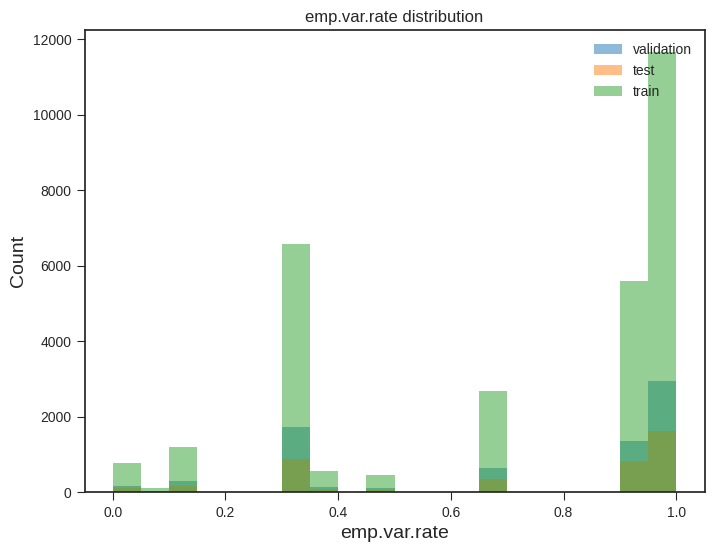

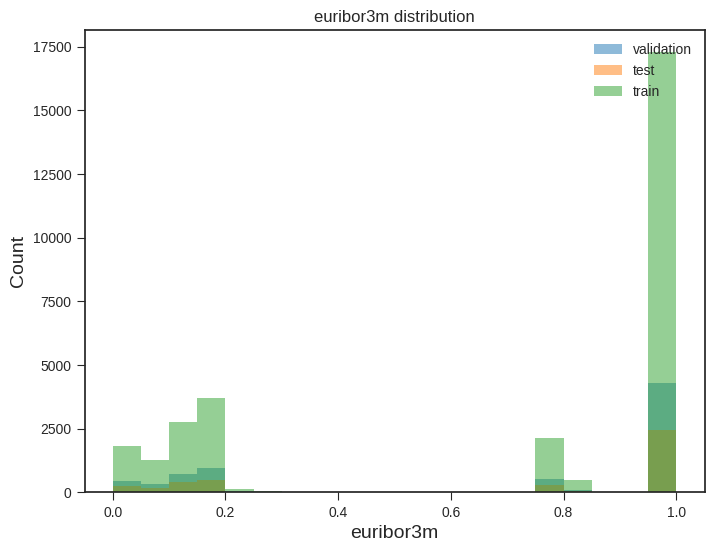

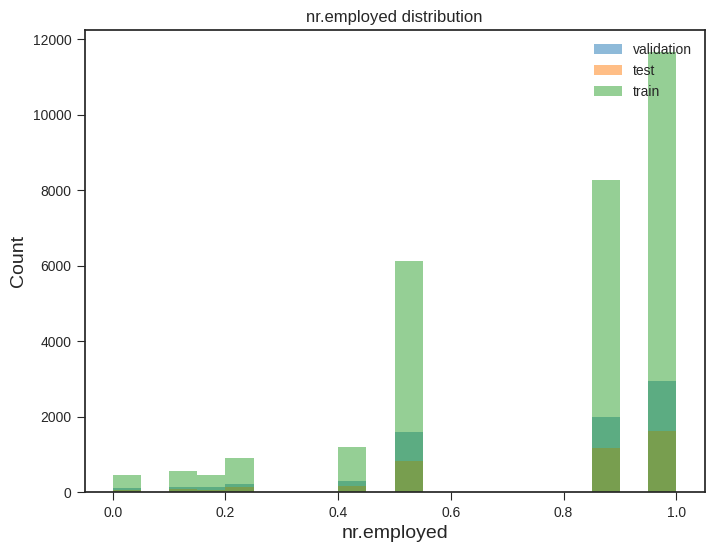

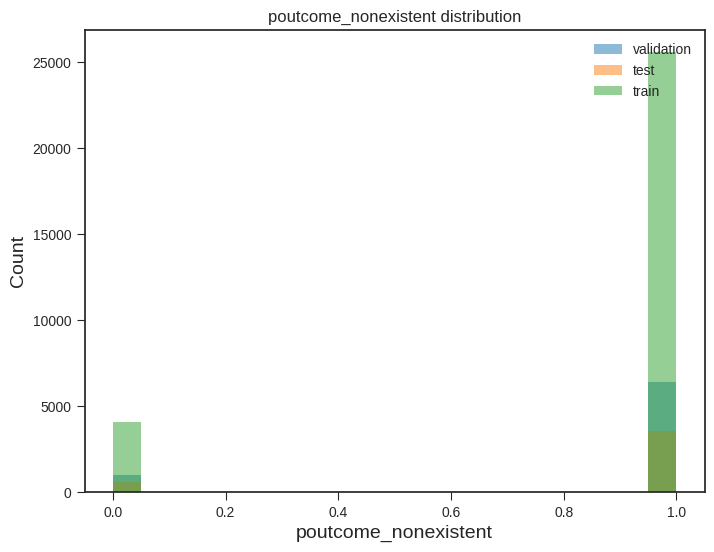

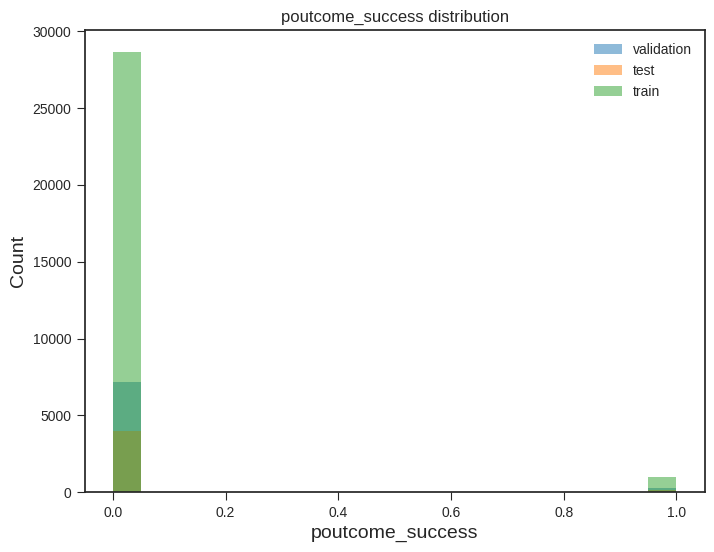

In [ ]:
# Looking the data for test, training and validation set
X_test_plot = X_test[['emp.var.rate','euribor3m','nr.employed','poutcome_nonexistent','poutcome_success']]

X_val_plot = X_val[['emp.var.rate','euribor3m','nr.employed','poutcome_nonexistent','poutcome_success']]

X_train_plot = X_train[['emp.var.rate','euribor3m','nr.employed','poutcome_nonexistent','poutcome_success']]

# Plotting the data to see the histogram
for c in X_test_plot.columns[:]:
  plt.figure(figsize=(8,6))
  plt.hist(X_val_plot[c], bins=20, alpha=0.5, label="validation")
  plt.hist(X_test_plot[c], bins=20, alpha=0.5, label="test")
  plt.hist(X_train_plot[c], bins=20, alpha=0.5, label="train")
  plt.xlabel(c, size=14)
  plt.ylabel("Count", size=14)
  plt.legend(loc='upper right')
  plt.title("{} distribution".format(c))
  plt.show()


Yes, the training data and testng data are same. The only difference is testing data is less than the training one as testing data is a small part of training data.

**Are the predictor variables independent of all other predictor variables?**


In [ ]:
data.corr()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,...,day_of_week_fri,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_failure,poutcome_nonexistent,poutcome_success,y_no,y_yes
age,1.000000,-0.000878,0.004651,-0.034400,0.024397,-0.000204,0.001111,0.129067,0.010875,-0.017611,...,0.011991,0.020627,-0.025029,0.019130,-0.026308,-0.012958,-0.005851,0.033175,-0.037232,0.037232
duration,-0.000878,1.000000,-0.071745,-0.047572,0.020610,-0.028051,0.005224,-0.008026,-0.032955,-0.044786,...,-0.010855,-0.021587,0.013409,0.006926,0.012039,0.010257,-0.023255,0.027109,-0.025964,0.025964
campaign,0.004651,-0.071745,1.000000,0.052619,-0.079216,0.150785,0.127797,-0.013618,0.135171,0.144137,...,0.025543,0.009348,0.005136,-0.020507,-0.019454,-0.060270,0.076639,-0.044457,0.051008,-0.051008
pdays,-0.034400,-0.047572,0.052619,1.000000,-0.587530,0.271122,0.078951,-0.091406,0.296993,0.372714,...,0.017674,-0.004376,-0.011392,-0.009568,0.008226,-0.102387,0.211508,-0.231137,0.199334,-0.199334
previous,0.024397,0.020610,-0.079216,-0.587530,1.000000,-0.420639,-0.203213,-0.050862,-0.454598,-0.501459,...,0.004924,-0.000111,0.003530,0.000964,-0.009306,0.198429,-0.294998,0.228040,-0.197789,0.197789
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
poutcome_failure,-0.012958,0.010257,-0.060270,-0.102387,0.198429,-0.381731,-0.297156,-0.163009,-0.385567,-0.350106,...,0.019283,-0.001189,-0.004449,-0.006036,-0.007217,1.000000,-0.853260,-0.062990,-0.031908,0.031908
poutcome_nonexistent,-0.005851,-0.023255,0.076639,0.211508,-0.294998,0.472294,0.303272,0.100952,0.488447,0.493382,...,-0.009810,0.002189,-0.000591,0.001487,0.006557,-0.853260,1.000000,-0.466703,0.193580,-0.193580
poutcome_success,0.033175,0.027109,-0.044457,-0.231137,0.228040,-0.256475,-0.076438,0.083254,-0.280882,-0.350468,...,-0.013929,-0.002173,0.008677,0.007391,-0.000309,-0.062990,-0.466703,1.000000,-0.316357,0.316357
y_no,-0.037232,-0.025964,0.051008,0.199334,-0.197789,0.297894,0.135623,-0.053980,0.307715,0.354614,...,0.007285,0.021146,-0.013785,-0.008227,-0.006393,-0.031908,0.193580,-0.316357,1.000000,-1.000000


<Axes: >

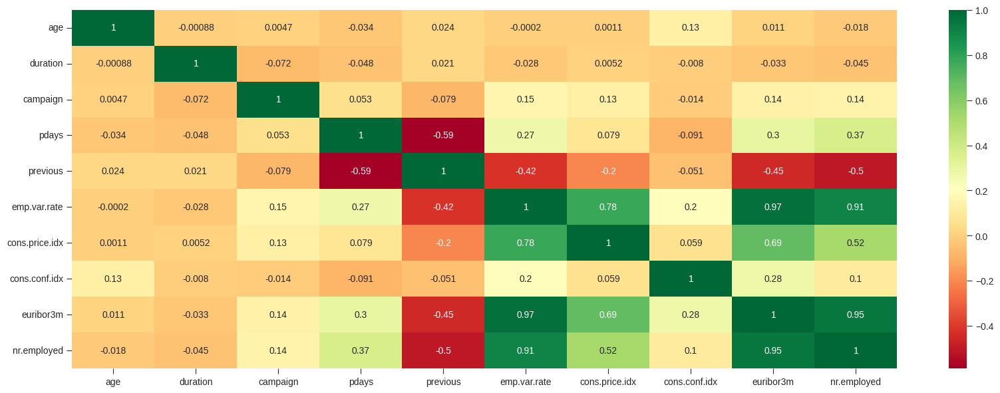

In [ ]:
#the heat map of the correlation
plt.figure(figsize=(20,7))
sns.heatmap(df.corr(), annot=True, cmap='RdYlGn')

 **Which predictor variables are the most important?**

From SelecKbest it is observed that emp.var.rate is the most important predictor variable


**Do the ranges of the predictor variables make sense?**

<Axes: >

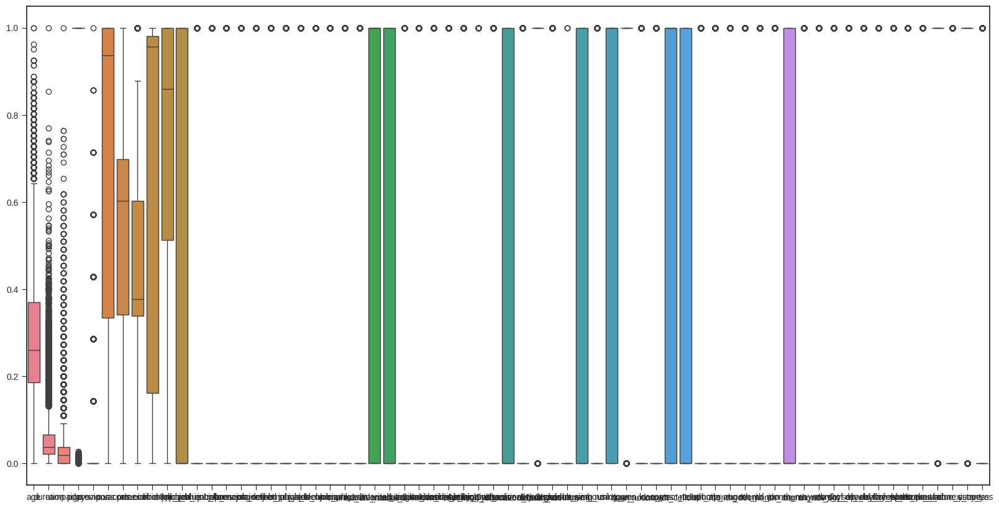

In [ ]:
#Checking the Ranges of the predictor variables and dependent variable
plt.figure(figsize=(20,10))
sns.boxplot(data=data)

Since we normalized the data, the variable ranges are practically identical. But as we can see from the image above, there are a lot of outliers that we might need to get rid of before moving on so that the data can start to make a lot more sense.

In [ ]:
#creating a drop list to drop the unnesccesary coulms from the dataset
drop_list = ['job_admin.','job_blue-collar','job_entrepreneur','job_housemaid',
             'job_management','job_retired','job_self-employed','job_services',
             'job_student','job_technician','job_unemployed','job_unknown',
             'education_basic.4y','education_basic.6y','education_basic.9y',
            'education_high.school','education_illiterate','education_professional.course'
,'education_university.degree','education_unknown','month_apr','month_aug','month_dec','month_jul',
 'month_jun','month_mar','month_may','month_nov','month_oct','month_sep','contact_cellular'
,'contact_telephone','day_of_week_fri','day_of_week_mon','day_of_week_thu','day_of_week_tue',
'day_of_week_wed','marital_divorced','marital_married','marital_single','marital_unknown','default_unknown',
'housing_unknown','loan_unknown','poutcome_nonexistent','default_no','default_yes','housing_no','housing_yes','loan_no','loan_yes','poutcome_failure',
'age','duration','campaign','pdays','previous','cons.price.idx','cons.conf.idx','y_no']
drop_data = data[drop_list]
data.drop(drop_list,axis=1,inplace=True)

In [ ]:
data.describe()

,emp.var.rate,euribor3m,nr.employed,poutcome_success,y_yes
count,41164.000000,41164.000000,41164.000000,41164.000000,41164.000000
mean,0.725408,0.677238,0.769126,0.033306,0.112598
std,0.327251,0.393205,0.273161,0.179436,0.316105
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.333333,0.160961,0.512287,0.000000,0.000000
50%,0.937500,0.957379,0.859735,0.000000,0.000000
75%,1.000000,0.980957,1.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000


<Axes: >

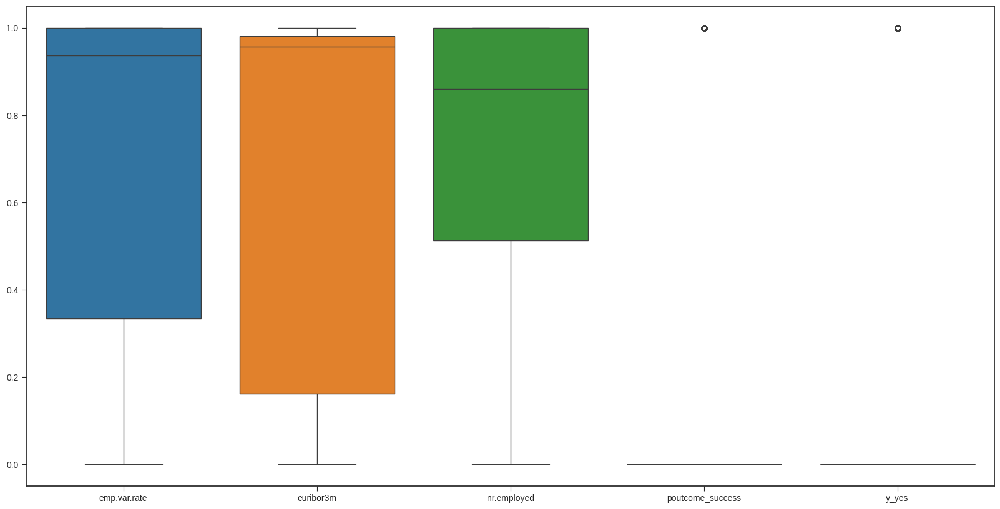

In [ ]:
#Checking the Ranges of the predictor variables and dependent variable
plt.figure(figsize=(20,10))
sns.boxplot(data=data)

**What are the distributions of the predictor variables?**   


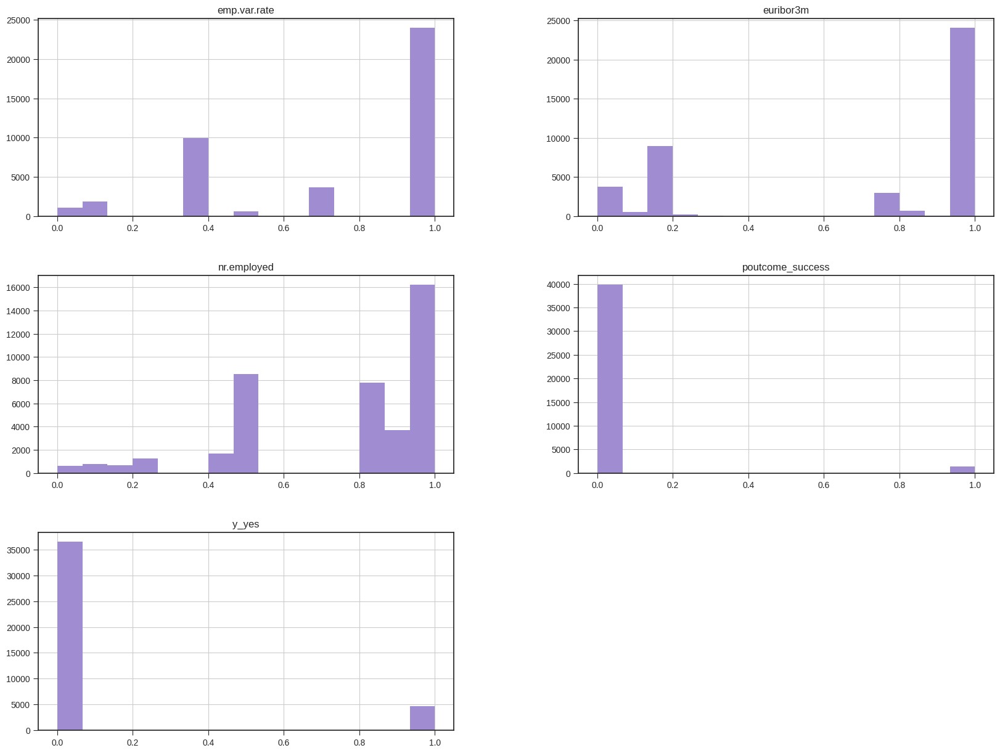

In [ ]:
plt.style.use('seaborn-ticks')

data.hist(bins=15, figsize=(20,15), color='#a08cd1')
plt.show();

Q11. **Remove outliers and keep outliers (does if have an effect of the final predictive model)?**



In [ ]:
# We will Run the Logistic regression for data before and after removing the outliers
#Now it is for before removing the outliers

#import the pkgs required
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
logisticRegr = LogisticRegression()



In [ ]:
#input variables
X1 = data[['emp.var.rate','poutcome_success','euribor3m','nr.employed']]
#output variable
y1 = data[['y_yes']]
#splitting data in to train and test, 20% of data will be used for testing
#stratify for sorting
#fixed value is assigned like random_state = 42 then no matter how many times you execute your code the result would be the same
X1_train_data, X1_test_data, y1_train_data, y1_test_data = train_test_split(X1, y1, test_size=0.2, random_state=42, stratify=y1)
logisticRegr.fit(X1_train_data, y1_train_data)

LogisticRegression()

In [ ]:
#The output of a Logistic regression model is a probability. We can select a threshold value.
#If the probability is greater than this threshold value, the event is predicted to happen otherwise it is predicted not to happen
threshold = 0.5

In [ ]:
#setting threshold 0.5 will be the ideal case
logisticRegr.predict(X1_test_data)

array([0, 0, 0, ..., 0, 0, 0], dtype=uint8)

In [ ]:
Z = logisticRegr.predict(X1_test_data)


In [ ]:
rms = mean_squared_error(y1_test_data, Z , squared=False);
rms

0.31884798098964545

In [ ]:
logisticRegr.score(X1_test_data, y1_test_data)


0.8983359650188266

From the above, we can observe that we got 89% accuracy for our dataset with outliers.

In [ ]:
#Now we will remove the outliers

Q1 = data.quantile(0.05)
Q3 = data.quantile(0.95)
#IQR = Q3 - Q1 I tried IQR method but it's returing me with nan, so I opted manually
#to remove outliers less than 5 persentile and more than 95 percentile.

#data2 = data2[~((data2 < (Q1 - 1.5 * IQR)) |(data > (Q3 + 1.5 * IQR))).any(axis=1)]
final_data = data[~((data < (Q1)) |(data > (Q3))).any(axis=1)]

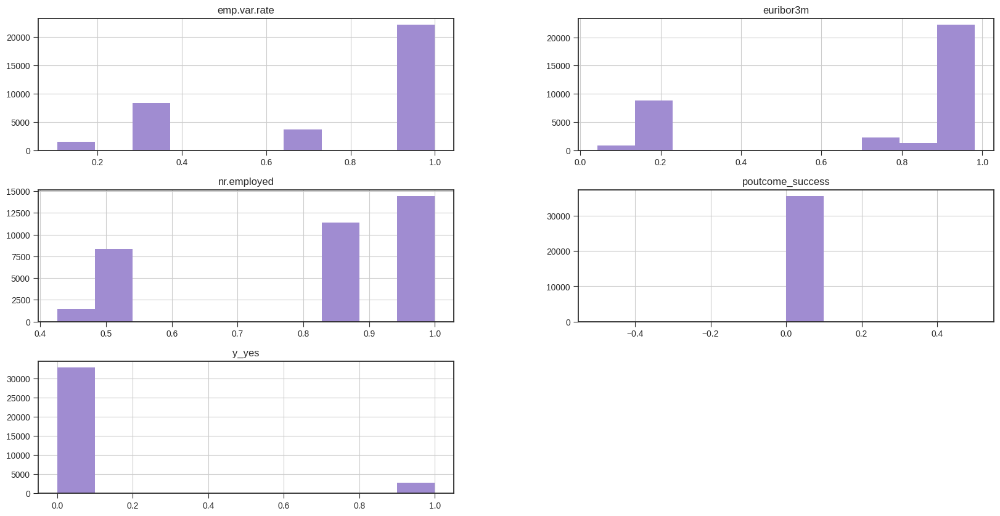

In [ ]:

plt.style.use('seaborn-ticks')

final_data.hist(bins=10, figsize=(20,10), color='#a08cd1')
plt.show();

Now we will again check the accuracy after removing the outliers

In [ ]:
#import the required packages
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
logisticRegr = LogisticRegression()
#input variables
X2 = final_data[['emp.var.rate','poutcome_success','euribor3m','nr.employed']]
#output variable
y2 = final_data[['y_yes']]
#splitting data in to train and test, 20% of data will be used for testing
#stratify for sorting
#fixed value is assigned like random_state = 42
X2_train_data, X2_test_data, y2_train_data, y2_test_data = train_test_split(X2, y2, test_size=0.2, random_state=42, stratify=y2)
logisticRegr.fit(X2_train_data, y2_train_data)

LogisticRegression()

In [ ]:
#The output of a Logistic regression model is a probability. We can select a threshold value.
#If the probability is greater than this threshold value, the event is predicted to happen otherwise it is predicted not to happen
threshold = 0.5
#setting threshold 0.5 will be the ideal case
logisticRegr.predict(X2_test_data)

array([0, 0, 0, ..., 0, 0, 0], dtype=uint8)

In [ ]:

Z2 = logisticRegr.predict(X2_test_data)


In [ ]:

rms = mean_squared_error(y2_test_data, Z2 , squared=False);
rms

0.27574724389522315

In [ ]:
logisticRegr.score(X2_test_data, y2_test_data)


0.9239634574841883

**So for final_data(without outliers) the accuracy is 92.3%**

And the data with Outliers has the accuracy of 89%

We can conclude that Data with outliers predicts less accuracy than the oe without outliers.

# **Remove 1%, 5%, and 10% of your data randomly and impute the values back using at least 3 imputation methods. How well did the methods recover the missing values?  That is remove some data, check the % error on residuals for numeric data and check for bias and variance of the error.**

In [ ]:
!pip install fancyimpute


In [ ]:

from sklearn.impute import SimpleImputer
from fancyimpute import KNN

# Remove 1%, 5%, and 10% of the data randomly
def remove_random_data(data, percentage):
    rows = data.shape[0]
    columns = data.shape[1]
    to_remove = int(rows * percentage)
    indexes = np.random.choice(rows, to_remove, replace=False)
    data_missing = data.copy()
    data_missing.iloc[indexes, :] = np.nan
    return data_missing

In [ ]:

# Calculate % error on residuals for numeric data
def calculate_error(data, data_missing, method):
    data_imputed = method.fit_transform(data_missing)
    error = np.abs(data_imputed - data)
    total_error = error.sum()
    percent_error = (total_error / data.size) * 100
    return percent_error


In [ ]:

# Check for bias and variance of the error
def check_bias_variance(data, data_missing, method):
    data_imputed = method.fit_transform(data_missing)
    bias = np.mean(data_imputed - data)
    variance = np.var(data_imputed - data)
    return bias, variance

In [ ]:

# Remove 1% of data
data_missing_1 = remove_random_data(data, 0.01)

In [ ]:

# Remove 5% of data
data_missing_5 = remove_random_data(data, 0.05)

# Remove 10% of data
data_missing_10 = remove_random_data(data, 0.1)

In [ ]:


# Impute values using the mean method
mean_imp = SimpleImputer(strategy='mean')
mean_error_1 = calculate_error(data, data_missing_1, mean_imp)
mean_error_5 = calculate_error(data, data_missing_5, mean_imp)
mean_error_10 = calculate_error(data, data_missing_10, mean_imp)
mean_bias_1, mean_variance_1 = check_bias_variance(data, data_missing_1, mean_imp)
mean_bias_5, mean_variance_5 = check_bias_variance(data, data_missing_5, mean_imp)
mean_bias_10, mean_variance_10 = check_bias_variance(data, data_missing_10, mean_imp)


In [ ]:
# Impute values using the median method
median_imp = SimpleImputer(strategy='median')
median_error_1 = calculate_error(data, data_missing_1, median_imp)
median_error_5 = calculate_error(data, data_missing_5, median_imp)
median_error_10 = calculate_error(data, data_missing_10, median_imp)
median_bias_1, median_variance_1 = check_bias_variance(data, data_missing_1, median_imp)
median_bias_5, median_variance_5 = check_bias_variance(data, data_missing_5, median_imp)
median_bias_10, median_variance_10 = check_bias_variance(data, data_missing_10, median_imp)

In [ ]:
print("Mean Impute Error for 1% Missing Data: ", mean_error_1)
print("Mean Impute Error for 5% Missing Data: ", mean_error_5)
print("Mean Impute Error for 10% Missing Data: ", mean_error_10)
print("Median Impute Error for 1% Missing Data: ", median_error_1)
print("Median Impute Error for 5% Missing Data: ", median_error_5)
print("Median Impute Error for 10% Missing Data: ", median_error_10)


Mean Impute Error for 1% Missing Data:  emp.var.rate        0.059286
euribor3m           0.073074
nr.employed         0.048037
poutcome_success    0.012998
y_yes               0.037195
dtype: float64
Mean Impute Error for 5% Missing Data:  emp.var.rate        0.296065
euribor3m           0.366086
nr.employed         0.239124
poutcome_success    0.065442
y_yes               0.197066
dtype: float64
Mean Impute Error for 10% Missing Data:  emp.var.rate        0.588616
euribor3m           0.726934
nr.employed         0.468503
poutcome_success    0.123503
y_yes               0.397482
dtype: float64
Median Impute Error for 1% Missing Data:  emp.var.rate        0.055064
euribor3m           0.062513
nr.employed         0.042187
poutcome_success    0.006802
y_yes               0.018949
dtype: float64
Median Impute Error for 5% Missing Data:  emp.var.rate        0.265807
euribor3m           0.305053
nr.employed         0.209311
poutcome_success    0.034496
y_yes               0.108833
dtype: flo

In [ ]:
print("Mean Impute Bias for 1% Missing Data: " , mean_bias_1)
print("Mean Impute Variance for 1% Missing Data: ", mean_variance_1)
print("Median Impute Bias for 1% Missing Data: ", median_bias_1)
print("Median Impute Variance for 1% Missing Data: ", median_variance_1)


Mean Impute Bias for 1% Missing Data:  emp.var.rate        0.000154
euribor3m           0.000164
nr.employed         0.000081
poutcome_success   -0.000008
y_yes               0.000179
dtype: float64
Mean Impute Variance for 1% Missing Data:  emp.var.rate        0.001096
euribor3m           0.001586
nr.employed         0.000774
poutcome_success    0.000329
y_yes               0.000861
dtype: float64
Median Impute Bias for 1% Missing Data:  emp.var.rate        0.002270
euribor3m           0.002960
nr.employed         0.000985
poutcome_success   -0.000340
y_yes              -0.000947
dtype: float64
Median Impute Variance for 1% Missing Data:  emp.var.rate        0.001605
euribor3m           0.002452
nr.employed         0.000870
poutcome_success    0.000340
y_yes               0.000947
dtype: float64


In [ ]:
#By using KNN
from sklearn.impute import KNNImputer


# Specify the number of nearest neighbors to use (k)
k = 5

# Create the KNN imputer
imputer = KNNImputer(n_neighbors=k)

# Impute the missing values in data_missing_1 using KNN
data_imputed_1 = imputer.fit_transform(data_missing_1)

# Impute the missing values in data_missing_5 using KNN
data_imputed_5 = imputer.fit_transform(data_missing_5)

# Impute the missing values in data_missing_10 using KNN
data_imputed_10 = imputer.fit_transform(data_missing_10)

In [ ]:
#To print the mean squared error (MSE) between the original values and the imputed values

# Calculate the MSE between the original data and data_imputed_1
mse_1 = np.mean((data - data_imputed_1)**2)
print("MSE for 1% missing data:", mse_1)

# Calculate the MSE between the original data and data_imputed_5
mse_5 = np.mean((data - data_imputed_5)**2)
print("MSE for 5% missing data:", mse_5)

# Calculate the MSE between the original data and data_imputed_10
mse_10 = np.mean((data - data_imputed_10)**2)
print("MSE for 10% missing data:", mse_10)


MSE for 1% missing data: emp.var.rate        0.001096
euribor3m           0.001586
nr.employed         0.000774
poutcome_success    0.000329
y_yes               0.000861
dtype: float64
MSE for 5% missing data: emp.var.rate        0.005372
euribor3m           0.007837
nr.employed         0.003894
poutcome_success    0.001665
y_yes               0.004850
dtype: float64
MSE for 10% missing data: emp.var.rate        0.010567
euribor3m           0.015389
nr.employed         0.007421
poutcome_success    0.002923
y_yes               0.009870
dtype: float64


**For categorical data, calculate the accuracy and a confusion matrix.**
From above we already got the accuracy be 89%(with outliers) and 92% without them.

Now

Confusion Matrix:

A confusion matrix is a technique for summarizing the performance of a classification algorithm.


In [ ]:

#Confusion matric for data with out outliers
from sklearn.metrics import confusion_matrix #for confusion matrix
from sklearn.metrics import classification_report #for classification_report
print(classification_report(y2_test_data,Z2))
print(confusion_matrix(y2_test_data,Z2))

              precision    recall  f1-score   support

           0       0.92      1.00      0.96      6574
           1       0.00      0.00      0.00       541

    accuracy                           0.92      7115
   macro avg       0.46      0.50      0.48      7115
weighted avg       0.85      0.92      0.89      7115

[[6574    0]
 [ 541    0]]


In [ ]:

#Confusion matric for data with outliers
from sklearn.metrics import confusion_matrix #for confusion matrix
from sklearn.metrics import classification_report #for classification_report
print(classification_report(y1_test_data,Z))
print(confusion_matrix(y1_test_data,Z))


              precision    recall  f1-score   support

           0       0.90      0.99      0.95      7306
           1       0.70      0.17      0.28       927

    accuracy                           0.90      8233
   macro avg       0.80      0.58      0.61      8233
weighted avg       0.88      0.90      0.87      8233

[[7236   70]
 [ 767  160]]


## **H2O AUTOML**

In [ ]:
!pip install h2o
%matplotlib inline
import random, os, sys
import pprint
import operator
from h2o.estimators.glm import H2OGeneralizedLinearEstimator
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.estimators.random_forest import H2ORandomForestEstimator
from h2o.estimators.deeplearning import H2ODeepLearningEstimator
from tabulate import tabulate
from h2o.automl import H2OAutoML
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np

In [ ]:

# importing H20 automl
#H2O AutoML provides necessary data processing capabilities.
#So there is no need to create duplicates and can take care of missing value imputation and other data cleaning activities.
import h2o
from h2o.automl import H2OAutoML
import os


In [ ]:
h2o.init(strict_version_check=False)
#It starts the H2o clusters

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.22" 2024-01-16; OpenJDK Runtime Environment (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1); OpenJDK 64-Bit Server VM (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpnweuckmy
  JVM stdout: /tmp/tmpnweuckmy/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpnweuckmy/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,07 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_j4vqd2
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.170 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [ ]:

# Setting up maximum runtime for the AutoML
min_mem_size = 6
#min_mem_size specifies the minimum memory (in gigabytes) that should be allocated to the H2O cluster.


run_time = 222

# run_time specifies the maximum runtime (in seconds) for the AutoML algorithm to search for the best model.
# This parameter helps to limit the time the algorithm spends searching for the best model, as it can be time-consuming and resource-intensive.

In [ ]:
from distutils.util import strtobool
import psutil
pct_memory = 0.5
#This line sets the percentage of available memory to use for the H2O cluster to 50% (0.5).
virtual_memory = psutil.virtual_memory()
#The above line gets information about the available system memory using the psutil.virtual_memory() function, and stores it in the virtual_memory variable.
min_mem_size = int(round(int(pct_memory * virtual_memory.available) / 1073741824, 0))

# finally dividing the available memory by the number of gigabytes in a byte (1073741824) and rounding to the nearest integer.
print(min_mem_size)

5


In [ ]:
import random, os, sys
import logging


port_no=random.randint(5555,55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
except:
  logging.critical('h2o.init')
  h2o.download_all_logs(dirname=logs_path, filename=logfile)
  h2o.cluster().shutdown()
  sys.exit(2)
# in try: we are intializing H2O cluster
  #in except: If the H2O cluster initialization fails
  # (for example, if the specified port is already in use), the code logs a critical error using the logging.critical() function,
  #  downloads all logs using h2o.download_all_logs() function and then shuts down the H2O cluster using h2o.cluster().shutdown().
  #  Finally, the code exits with a status code of 2 using the sys.exit(2) function.

Checking whether there is an H2O instance running at http://localhost:22371..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.22" 2024-01-16; OpenJDK Runtime Environment (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1); OpenJDK 64-Bit Server VM (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpj4482ooh
  JVM stdout: /tmp/tmpj4482ooh/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpj4482ooh/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:22371
Connecting to H2O server at http://127.0.0.1:22371 ... successful.


H2O_cluster_uptime:,08 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_j9uvz5
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,5 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [ ]:
data = h2o.import_file('https://raw.githubusercontent.com/yugakanse/Assignment-Combine-Data-Cleaning-Feature-Selection-Modeling-and-Interpretability-into-one-report/main/bank-additional-full.csv')


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
data.head()

age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191,no
57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191,no
37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191,no
40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191,no
56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191,no
45,services,married,basic.9y,unknown,no,no,telephone,may,mon,198,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191,no
59,admin.,married,professional.course,no,no,no,telephone,may,mon,139,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191,no
41,blue-collar,married,unknown,unknown,no,no,telephone,may,mon,217,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191,no
24,technician,single,professional.course,no,yes,no,telephone,may,mon,380,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191,no
25,services,single,high.school,no,yes,no,telephone,may,mon,50,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191,no


In [ ]:
missing_values = data.isna().sum()
print(missing_values)


0.0


In [ ]:
data.types


{'age': 'int',
 'job': 'enum',
 'marital': 'enum',
 'education': 'enum',
 'default': 'enum',
 'housing': 'enum',
 'loan': 'enum',
 'contact': 'enum',
 'month': 'enum',
 'day_of_week': 'enum',
 'duration': 'int',
 'campaign': 'int',
 'pdays': 'int',
 'previous': 'int',
 'poutcome': 'enum',
 'emp.var.rate': 'real',
 'cons.price.idx': 'real',
 'cons.conf.idx': 'real',
 'euribor3m': 'real',
 'nr.employed': 'real',
 'y': 'enum'}

In [ ]:
data.shape


(41188, 21)

In [ ]:
data.describe(chunk_summary=True)
# The "chunk_summary=True" parameter tells H2O.ai to display a summary of each chunk of data, as well as a summary of the entire dataset.

Rows:41188
Cols:21

Chunk compression summary: 
chunk_type    chunk_name                 count    count_percentage    size      size_percentage
------------  -------------------------  -------  ------------------  --------  -----------------
C0L           Constant long              17       10.119              1.3 KB    0.178148
C0D           Constant double            11       6.54762             880  B    0.115272
CBS           Binary                     9        5.35714             6.3 KB    0.842666
CXI           Sparse Integers            13       7.7381              9.5 KB    1.27271
C1N           1-Byte Integers (w/o NAs)  78       46.4286             397.5 KB  53.3133
C1S           1-Byte Fractions           15       8.92857             76.6 KB   10.2744
C2            2-Byte Integers            12       7.14286             121.6 KB  16.3118
C2S           2-Byte Fractions           13       7.7381              131.9 KB  17.6917

Frame distribution summary: 
                 size      number_of_rows    number_of_chunks_per_column    number_of_chunks
---------------  --------  ----------------  -----------------------------  ------------------
127.0.0.1:22371  745.5 KB  41188             8                              168
mean             745.5 KB  41188             8                              168
min              745.5 KB  41188             8                              168
max              745.5 KB  41188             8                              168
stddev           0  B      0                 0                              0
total            745.5 KB  41188             8                              168

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
type,int,enum,enum,enum,enum,enum,enum,enum,enum,enum,int,int,int,int,enum,real,real,real,real,real,enum
mins,17.0,,,,,,,,,,0.0,1.0,0.0,0.0,,-3.4,92.201,-50.8,0.634,4963.6,
mean,40.02406040594343,,,,,,,,,,258.2850101971447,2.567592502670679,962.4754540157328,0.17296299893172798,,0.0818855006312521,93.5756643682626,-40.50260027192387,3.6212908128581076,5167.035910944939,
maxs,98.0,,,,,,,,,,4918.0,56.0,999.0,7.0,,1.4,94.767,-26.9,5.045,5228.1,
sigma,10.421249980934054,,,,,,,,,,259.2792488364648,2.77001354290233,186.9109073447419,0.4949010798392899,,1.5709597405170257,0.5788400489540979,4.6281978561745465,1.7344474048512613,72.2515276682598,
zeros,0,,,,,,,,,,4,0,15,35563,,0,0,0,0,0,
missing,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,56.0,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261.0,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57.0,services,married,high.school,unknown,no,no,telephone,may,mon,149.0,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37.0,services,married,high.school,no,yes,no,telephone,may,mon,226.0,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no




1.   **Frame distribution summary** section provides information about the distribution of the data across the available nodes in the H2O cluster.

2.   **Column type frequency summary** section shows the frequency of each column type in the dataset, which can be helpful for understanding the data types and formats of the columns in the dataset.



In [ ]:
# Create a 80/20 train/test split
pct_rows=0.80
data_train, data_test = data.split_frame([pct_rows])

In [ ]:
#Display all columns in X
X=data.columns
print(X)

['age', 'job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays', 'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed', 'y']


In [ ]:
#Seperate Dependent variable from Independent variable
y_numeric ='y'
X.remove(y_numeric)
print(X)


['age', 'job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays', 'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']


**TRAINING AUTOML MODELS**

In [ ]:
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)  # Setting of AutoML

In [ ]:
aml.train(x=X, y=y_numeric, training_frame=data_train)  # Trainig the dataset on different models

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),3/3
# GBM base models (used / total),1/1
# XGBoost base models (used / total),1/1
# GLM base models (used / total),1/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5
Metalearner fold_column,None
Custom metalearner hyperparameters,None


In [ ]:

#Creates the leader Board for all out models, ranking them by their performance(default: mean_per_class_error	)
#We can also observe that as we go below the leaderboard the logloss, rmse and mse are increasing as well.
#Here from the leaderboard we have "GBM_5_AutoML_1_20221107_231030	" as the leader(best performing) model .
lb = aml.leaderboard

In [ ]:
lb.head()


model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
StackedEnsemble_BestOfFamily_1_AutoML_1_20240402_205247,0.948431,0.174416,0.656803,0.14601,0.236381,0.0558758
StackedEnsemble_BestOfFamily_2_AutoML_1_20240402_205247,0.947657,0.176214,0.656117,0.146574,0.236599,0.0559789
GBM_1_AutoML_1_20240402_205247,0.947479,0.175703,0.652112,0.144154,0.236974,0.0561569
XGBoost_1_AutoML_1_20240402_205247,0.945791,0.179076,0.645256,0.151002,0.239723,0.0574672
GBM_4_AutoML_1_20240402_205247,0.941059,0.237778,0.625973,0.147715,0.262528,0.0689211
GBM_2_AutoML_1_20240402_205247,0.939247,0.224936,0.628696,0.156986,0.256138,0.0656069
GBM_3_AutoML_1_20240402_205247,0.935437,0.236813,0.619208,0.15793,0.262306,0.0688047
GLM_1_AutoML_1_20240402_205247,0.934625,0.209478,0.589825,0.186428,0.251238,0.0631203
XGBoost_2_AutoML_1_20240402_205247,0.924663,0.278747,0.627086,0.159187,0.270991,0.0734363
DRF_1_AutoML_1_20240402_205247,0.901784,0.528608,0.556856,0.161852,0.257795,0.0664584


In [ ]:
all_predictions = aml.leader.predict(data_test)


stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [ ]:
all_predictions.head(15)


predict,no,yes
no,0.99793,0.00207046
no,0.997623,0.00237672
no,0.996967,0.00303348
no,0.99683,0.00316957
no,0.997094,0.00290637
no,0.997681,0.00231855
no,0.995858,0.0041417
no,0.99777,0.00222977
no,0.728339,0.271661
no,0.998055,0.0019448


In [ ]:
leaderboard = print(
    aml.leaderboard
)

model_id                                                      auc    logloss     aucpr    mean_per_class_error      rmse        mse
StackedEnsemble_BestOfFamily_1_AutoML_1_20240402_205247  0.948431   0.174416  0.656803                0.14601   0.236381  0.0558758
StackedEnsemble_BestOfFamily_2_AutoML_1_20240402_205247  0.947657   0.176214  0.656117                0.146574  0.236599  0.0559789
GBM_1_AutoML_1_20240402_205247                           0.947479   0.175703  0.652112                0.144154  0.236974  0.0561569
XGBoost_1_AutoML_1_20240402_205247                       0.945791   0.179076  0.645256                0.151002  0.239723  0.0574672
GBM_4_AutoML_1_20240402_205247                           0.941059   0.237778  0.625973                0.147715  0.262528  0.0689211
GBM_2_AutoML_1_20240402_205247                           0.939247   0.224936  0.628696                0.156986  0.256138  0.0656069
GBM_3_AutoML_1_20240402_205247                           0.935437   0.236813

## **Explanation:**
The table provides performance metrics for various models trained by AutoML, which includes:

A Stacked Ensemble model using all available models

A Stacked Ensemble model using the best performing models from each family

A Gradient Boosting Machine (GBM) model with ID 1

Another GBM model with ID 2

A GBM model with ID 4

An XGBoost model with ID 1

Another GBM model with ID 3

An XGBoost model with ID 2

A Generalized Linear Model (GLM) model with ID 1

The performance metrics reported for each model are:

AUC (Area Under the ROC Curve): A measure of how well the model can distinguish between positive and negative samples.

Log Loss: A measure of the model's error, where lower values indicate better performance.

AUCPR (Area Under the Precision-Recall Curve): A measure of the trade-off between precision and recall for different threshold values.

Mean Per-Class Error: The average error rate across all classes.

RMSE (Root Mean Squared Error): A measure of the model's error, where lower values indicate better performance.

MSE (Mean Squared Error): Another measure of the model's error, where lower values indicate better performance.

Based on the table, the Stacked Ensemble model using all available models achieved the highest AUC and AUCPR scores, indicating that it performed the best overall.

 However, the difference in performance between this model and the Stacked Ensemble model using the best performing models from each family was relatively small.

  The GLM model had the lowest AUC and AUCPR scores, indicating that it performed the worst overall.






In [ ]:
print(aml.leader)

Model Details
H2OStackedEnsembleEstimator : Stacked Ensemble
Model Key: StackedEnsemble_BestOfFamily_1_AutoML_1_20240402_205247


Model Summary for Stacked Ensemble: 
key                                   value
------------------------------------  ----------------
Stacking strategy                     cross_validation
Number of base models (used / total)  3/3
# GBM base models (used / total)      1/1
# XGBoost base models (used / total)  1/1
# GLM base models (used / total)      1/1
Metalearner algorithm                 GLM
Metalearner fold assignment scheme    Random
Metalearner nfolds                    5
Metalearner fold_column
Custom metalearner hyperparameters    None

ModelMetricsBinomialGLM: stackedensemble
** Reported on train data. **

MSE: 0.043445251930761916
RMSE: 0.20843524637345268
LogLoss: 0.13929745027849474
AUC: 0.9702091950768111
AUCPR: 0.7841031792627798
Gini: 0.9404183901536223
Null degrees of freedom: 10088
Residual degrees of freedom: 10085
Null deviance: 6951.79

In [ ]:
best_model = aml.leader
best_model.model_performance(data_test)

ModelMetricsBinomialGLM: stackedensemble
** Reported on test data. **

MSE: 0.0561940801159366
RMSE: 0.23705290573189902
LogLoss: 0.17626598353134124
AUC: 0.9485136717389174
AUCPR: 0.674701607521497
Gini: 0.8970273434778349
Null degrees of freedom: 8308
Residual degrees of freedom: 8305
Null deviance: 5953.458698470759
Residual deviance: 2929.1881143238293
AIC: 2937.1881143238293

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3528381186157483
       no    yes    Error    Rate
-----  ----  -----  -------  --------------
no     6881  467    0.0636   (467.0/7348.0)
yes    249   712    0.2591   (249.0/961.0)
Total  7130  1179   0.0862   (716.0/8309.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.352838     0.665421  199
max f2                       0.133942     0.770311  290
max f0point5                 0.523306     0.649987  131
max accuracy                 0.523306     0.91792   131
max precision                0.937577     1         0
max recall                   0.00203601   1         399
max specificity              0.937577     1         0
max absolute_mcc             0.352838     0.6208    199
max min_per_class_accuracy   0.167415     0.881374  274
max mean_per_class_accuracy  0.102431     0.892687  306
max tns                      0.937577     7348      0
max fns                      0.937577     960       0
max fps                      0.00203601   7348      399
max tps                      0.00203601   961       399
max tnr                      0.937577     1         0
max fnr                      0.937577     0.998959  0
max fpr                      0.00203601   1         399
max tpr                      0.00203601   1         399

Gains/Lift Table: Avg response rate: 11.57 %, avg score: 11.45 %
group    cumulative_data_fraction    lower_threshold    lift       cumulative_lift    response_rate    score       cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  ---------  -----------------  ---------------  ----------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0101095                   0.852635           7.3081     7.3081             0.845238         0.88844     0.845238                    0.88844             0.0738814       0.0738814                  630.81    630.81             0.0721122
2        0.0200987                   0.7901             7.39615    7.35186            0.855422         0.820494    0.850299                    0.85467             0.0738814       0.147763                   639.615   635.186            0.14436
3        0.0300879                   0.740626           6.56278    7.08989            0.759036         0.765451    0.82                        0.82505             0.0655567       0.213319                   556.278   608.989            0.207195
4        0.040077                    0.692697           5.52107    6.69886            0.638554         0.715087    0.774775                    0.797641            0.0551509       0.26847                    452.107   569.886            0.258263
5        0.0500662                   0.657018           5.10438    6.38073            0.590361         0.673611    0.737981                    0.772895            0.0509886       0.319459                   410.438   538.073            0.304625
6        0.100012                    0.481349           5.06272    5.72252            0.585542         0.56723     0.661853                    0.670186            0.252862        0.57232                    406.272   472.252            0.534079
7        0.150078                    0.321729           3.69958    5.04766            0.427885         0.401469    0.583

Here, he AUC value of 0.9509 indicates that the model is able to distinguish between the positive and negative classes quite well. The confusion matrix shows that the model has a low error rate for the negative class (no), but a higher error rate for the positive class (yes).
So, the confusion matrix shows the number of true positive, true negative, false positive and false negative predictions made by the model. It also shows the error rate for each prediction made. The table also shows the maximum value of each evaluation metric and its corresponding threshold value.

The Gains/Lift Table is a measure of how much better the model is performing compared to a random model. It shows the response rate and score of the model as well as the cumulative response rate and score at different thresholds. The table also shows the lift and gain values of the model.

In [ ]:
# Getting the name of the best model
best_model_name = best_model.model_id

# Print the name of the best model
print("The best model is:", best_model_name)


The best model is: StackedEnsemble_BestOfFamily_1_AutoML_1_20240402_205247


**Explanation**: The top three models on the leaderboard differ in their approach to making predictions. The first two models are ensemble models, which combine multiple models, while the third model is a GBM which is a Gradient Boosting Method.

 Ensembles, particularly stacked ensembles, tend to perform better than single models as they use a combination of models to make predictions.

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

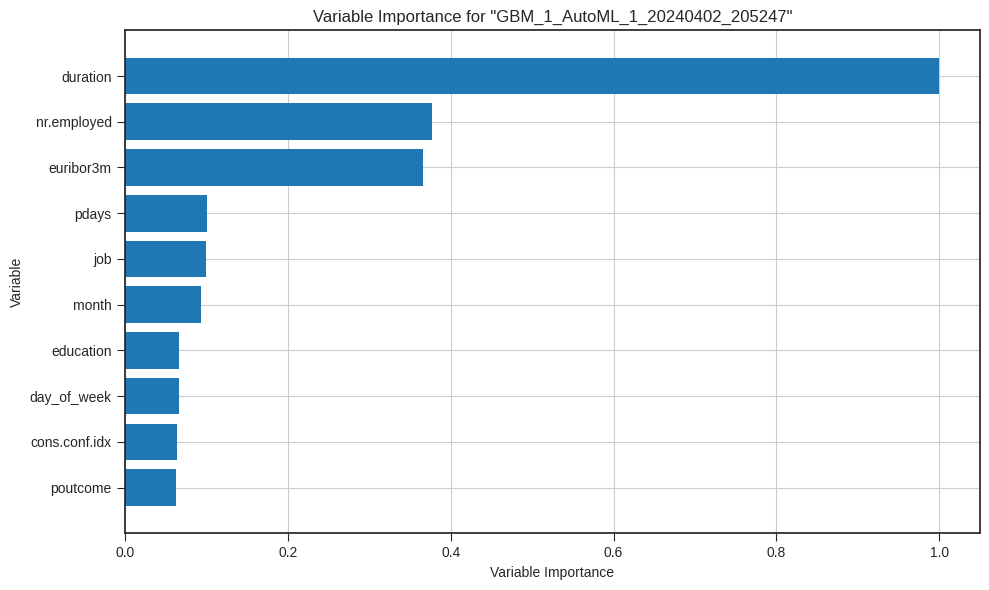

In [ ]:
best_mod = aml.explain(frame = data_test, figsize = (10,6),include_explanations=['varimp'])
#referred this line of code to find the variable importance from the notebook provided


The above graph shows the variable importance of the top third best model because the first (i.e., stackedensemble) does not have a variable importance plot.

In [ ]:
%matplotlib inline
best_model.varimp()

**As, stacked ensemble models do not have a variable importance plot. I will be tring to visualize the variable importance of the base models that are used to create the stacked ensemble in the next step. We will access the base models of the stacked ensemble using the base_models attribute.**

In [ ]:
from h2o.estimators import H2OGradientBoostingEstimator, H2ORandomForestEstimator, H2OStackedEnsembleEstimator

# Define base models with cross-validation
model1 = H2OGradientBoostingEstimator(nfolds=5, seed=123, keep_cross_validation_predictions=True)
model2 = H2ORandomForestEstimator(nfolds=5, seed=123, keep_cross_validation_predictions=True)

# Train base models on training data
model1.train(x=data.col_names[:-1], y=data.col_names[-1], training_frame=data_train)
model2.train(x=data.col_names[:-1], y=data.col_names[-1], training_frame=data_train)

# Train stacked ensemble model
ensemble = H2OStackedEnsembleEstimator(base_models=[model1, model2], seed=123)
ensemble.train(x=data.col_names[:-1], y=data.col_names[-1], training_frame=data_train)

# Evaluate ensemble model performance on test data
ensemble_perf = ensemble.model_performance(data_test)
print(ensemble_perf)


gbm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%
drf Model Build progress: |██████████████████████████████████████████████████████| (done) 100%
stackedensemble Model Build progress: |██████████████████████████████████████████| (done) 100%
ModelMetricsBinomialGLM: stackedensemble
** Reported on test data. **

MSE: 0.058963466166088684
RMSE: 0.24282394067737367
LogLoss: 0.19522325207868735
AUC: 0.949219265564982
AUCPR: 0.6755177461595313
Gini: 0.8984385311299641
Null degrees of freedom: 8308
Residual degrees of freedom: 8306
Null deviance: 5953.458698470759
Residual deviance: 3244.2200030436265
AIC: 3250.2200030436265

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.15529541407754985
       no    yes    Error    Rate
-----  ----  -----  -------  --------------
no     6745  603    0.0821   (603.0/7348.0)
yes    182   779    0.1894   (182.0/961.0)
Total  6927  1382   0.0945   (785.0/8309.0)

Maximum Metrics: Maximum metrics at their resp

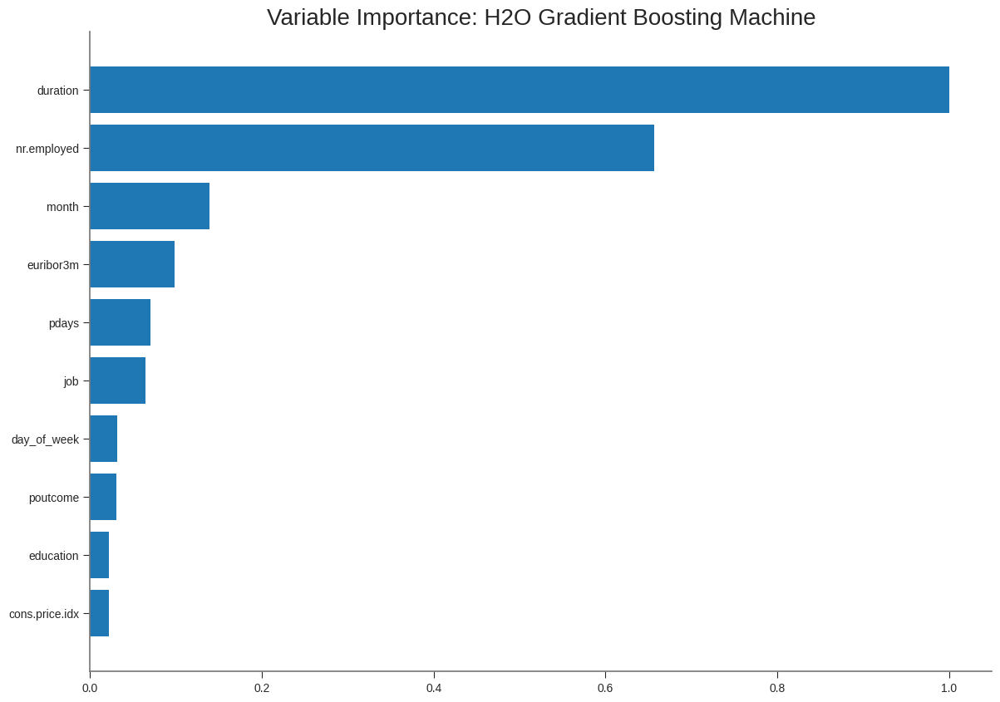

<Figure size 640x480 with 0 Axes>

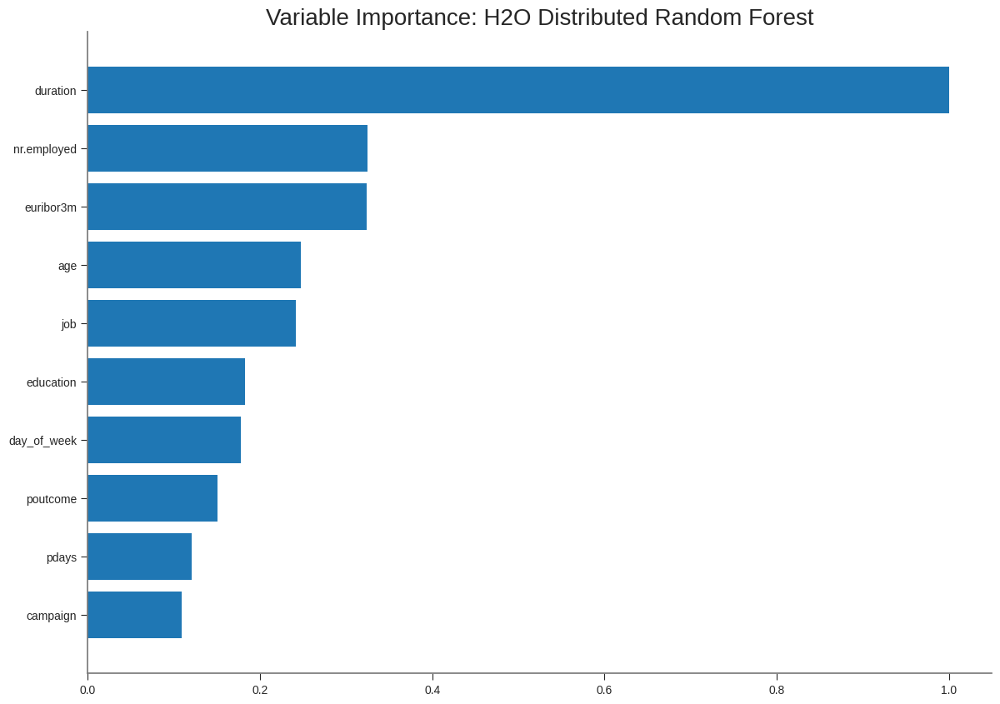

<Figure size 640x480 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt

# Plot variable importances for model1
model1_varimp = model1.varimp()
model1_varimp_plot = model1.varimp_plot()
plt.show(model1_varimp_plot)

# Plot variable importances for model2
model2_varimp = model2.varimp()
model2_varimp_plot = model2.varimp_plot()
plt.show(model2_varimp_plot)


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_BestOfFamily_2_AutoML_1_20240402_205247,0.948567,0.188172,0.672661,0.145626,0.240485,0.0578331,7470,0.043105,StackedEnsemble
StackedEnsemble_BestOfFamily_1_AutoML_1_20240402_205247,0.948514,0.176266,0.674702,0.16133,0.237053,0.0561941,4814,0.041648,StackedEnsemble
XGBoost_1_AutoML_1_20240402_205247,0.947395,0.181063,0.668363,0.145362,0.239194,0.057214,10256,0.006707,XGBoost
GBM_1_AutoML_1_20240402_205247,0.947282,0.177668,0.66887,0.151729,0.238101,0.0566922,8628,0.036928,GBM
GBM_2_AutoML_1_20240402_205247,0.942557,0.225197,0.649312,0.150172,0.257036,0.0660674,817,0.009575,GBM
GBM_4_AutoML_1_20240402_205247,0.940136,0.246793,0.633161,0.158681,0.268508,0.0720964,1096,0.005463,GBM
GBM_3_AutoML_1_20240402_205247,0.938718,0.245246,0.638952,0.156253,0.267647,0.071635,1130,0.008286,GBM
XGBoost_2_AutoML_1_20240402_205247,0.938625,0.330631,0.649273,0.157641,0.295492,0.0873152,1735,0.002587,XGBoost
GLM_1_AutoML_1_20240402_205247,0.934953,0.207023,0.622154,0.1789,0.250265,0.0626327,3667,0.006076,GLM
DRF_1_AutoML_1_20240402_205247,0.885001,0.719972,0.537587,0.195354,0.266235,0.0708812,1448,0.004977,DRF


# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## StackedEnsemble_BestOfFamily_1_AutoML_1_20240402_205247

,no,yes,Error,Rate
no,6881.0,467.0,0.0636,(467.0/7348.0)
yes,249.0,712.0,0.2591,(249.0/961.0)
Total,7130.0,1179.0,0.0862,(716.0/8309.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

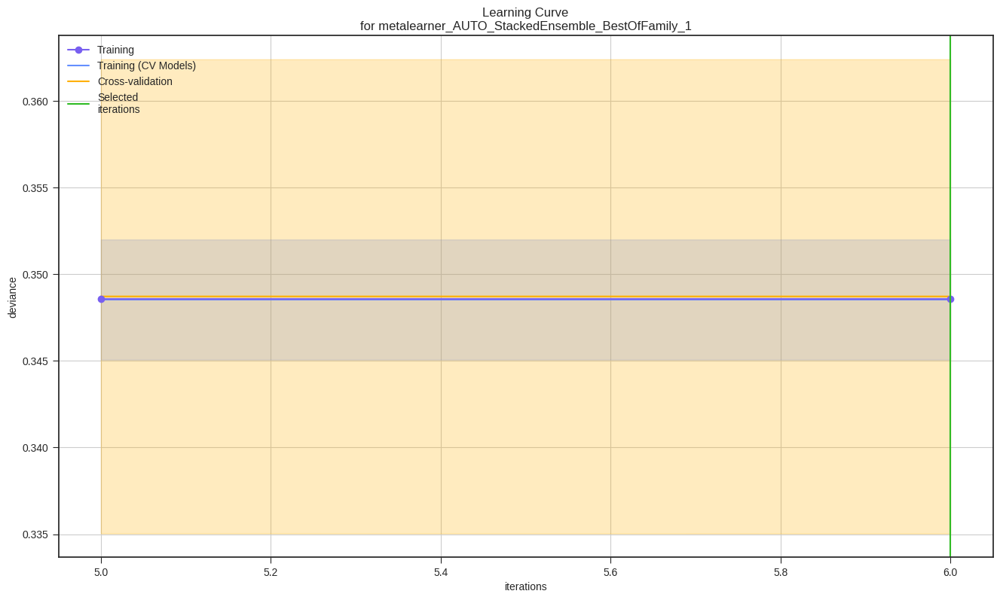

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

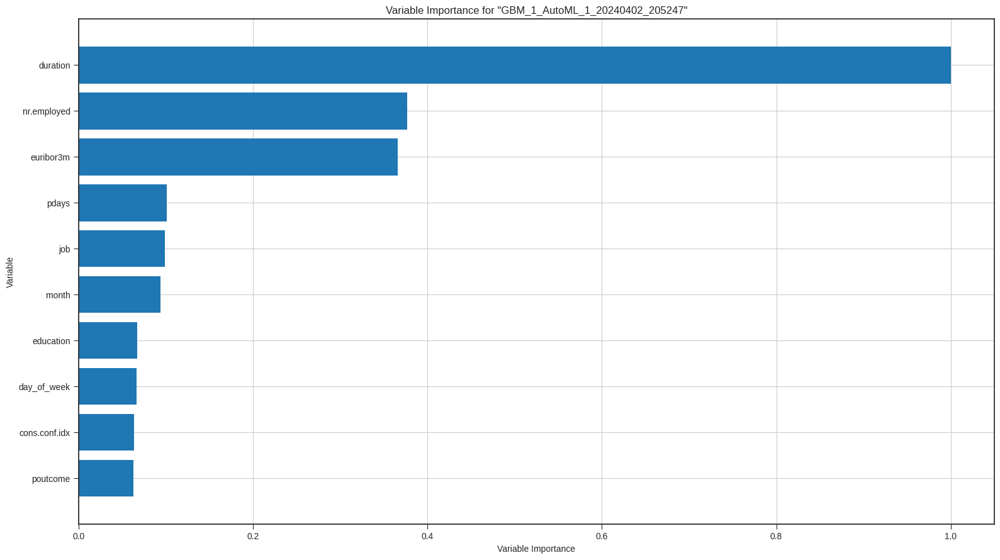

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

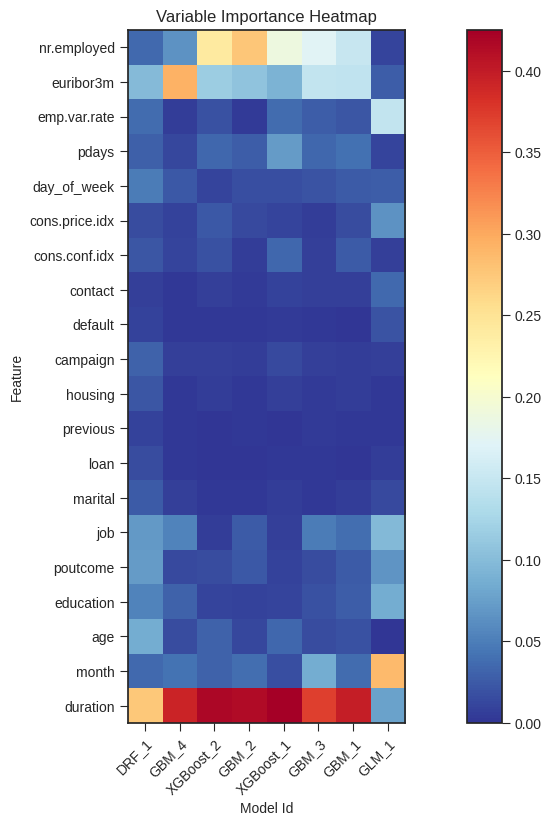

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

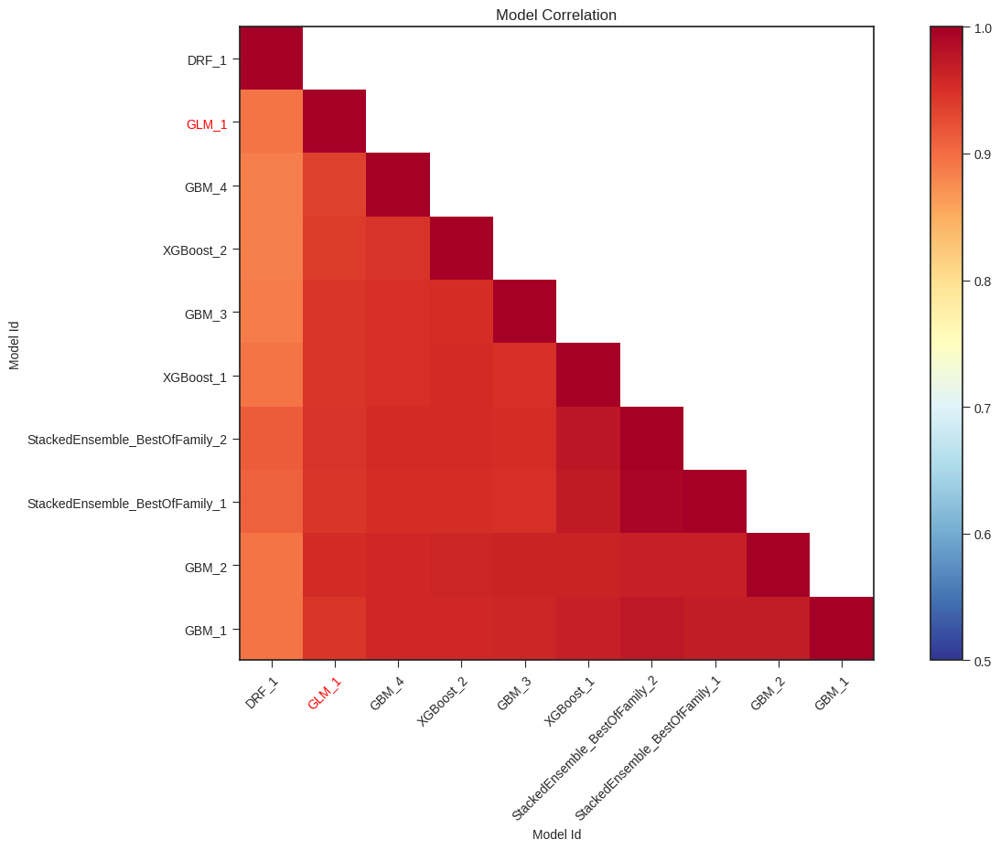

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

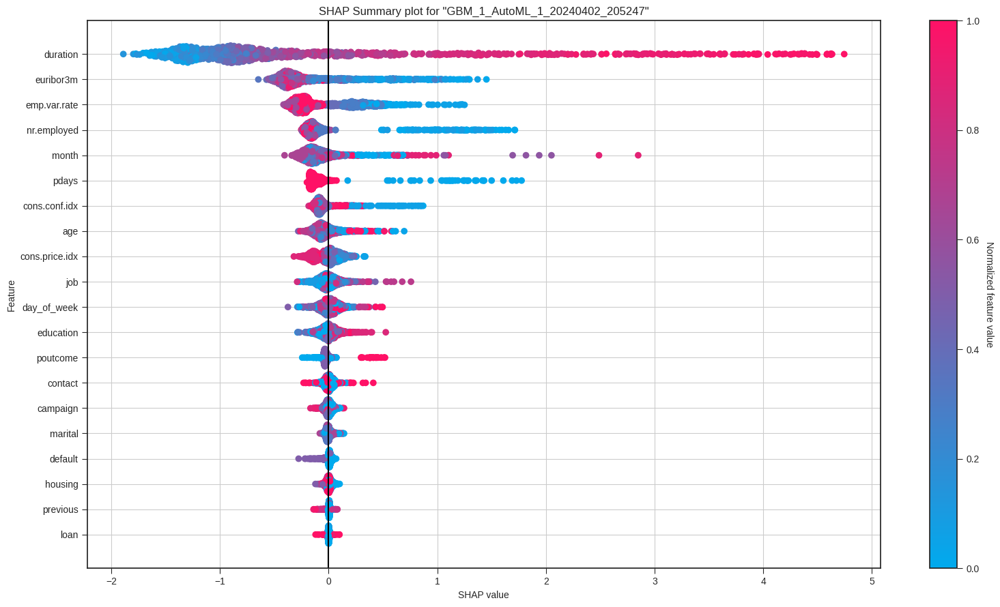

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

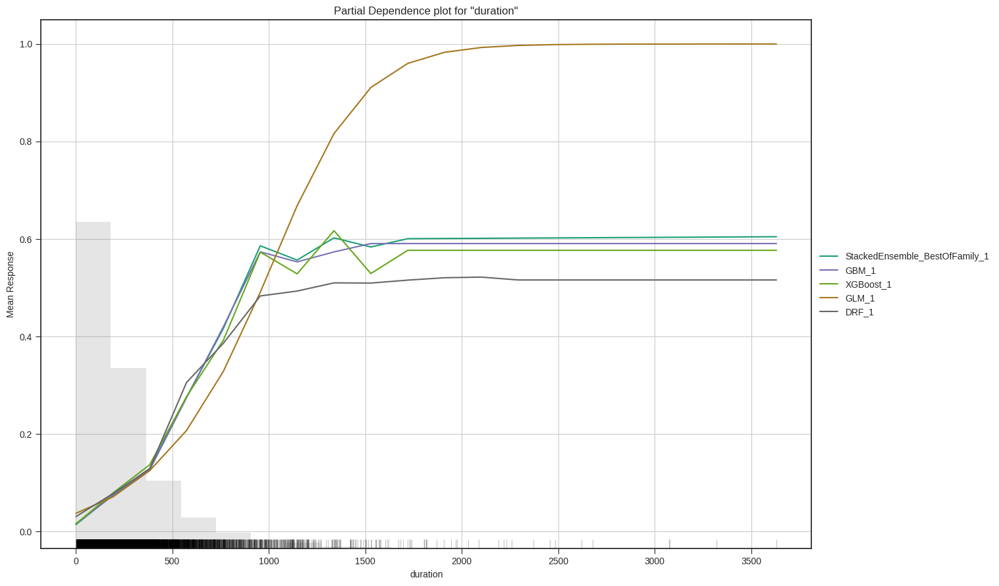

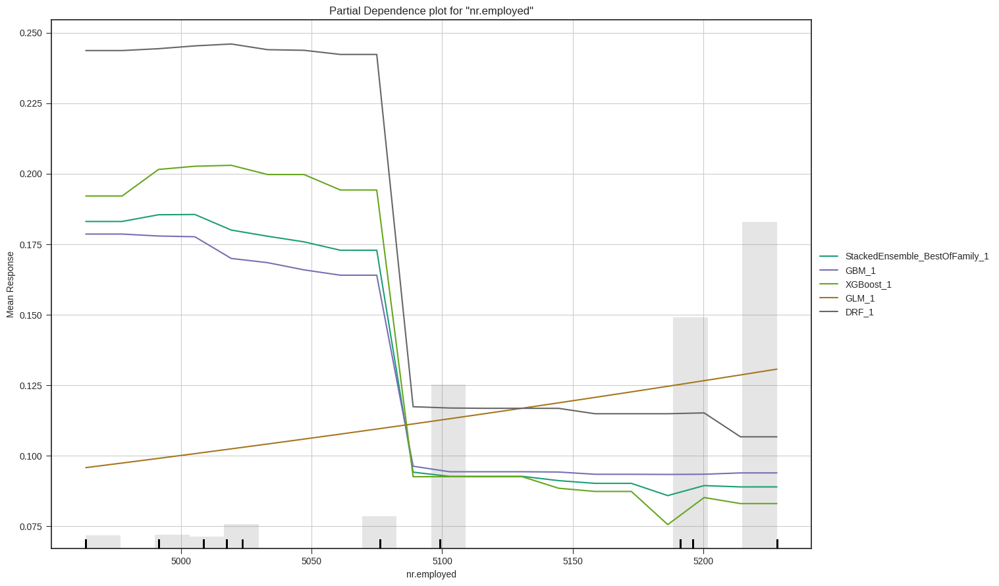

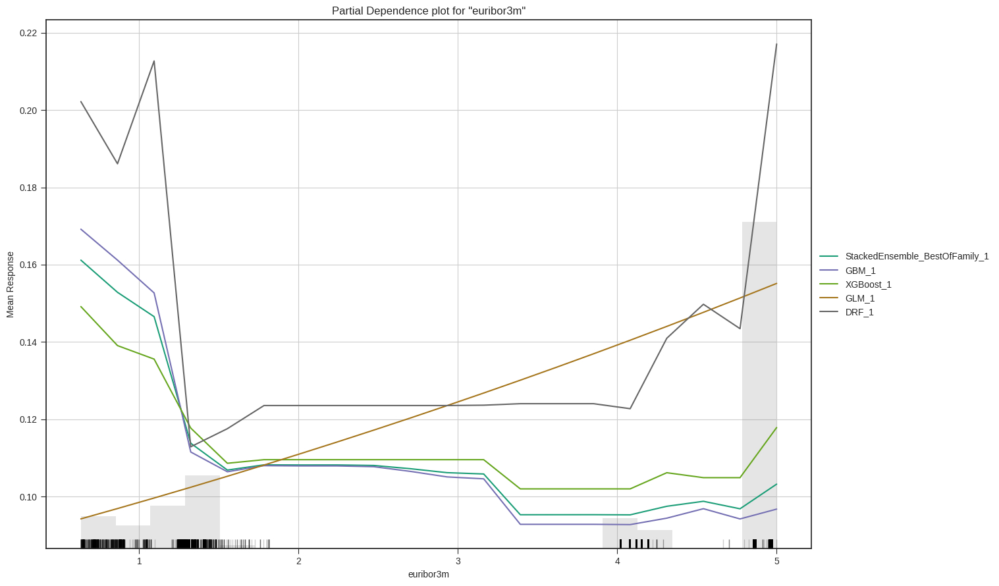

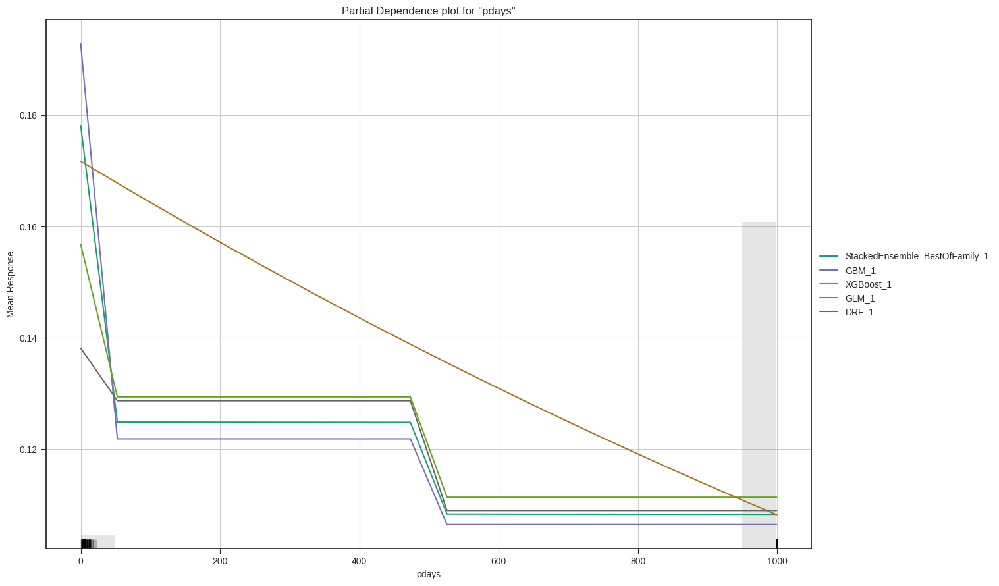

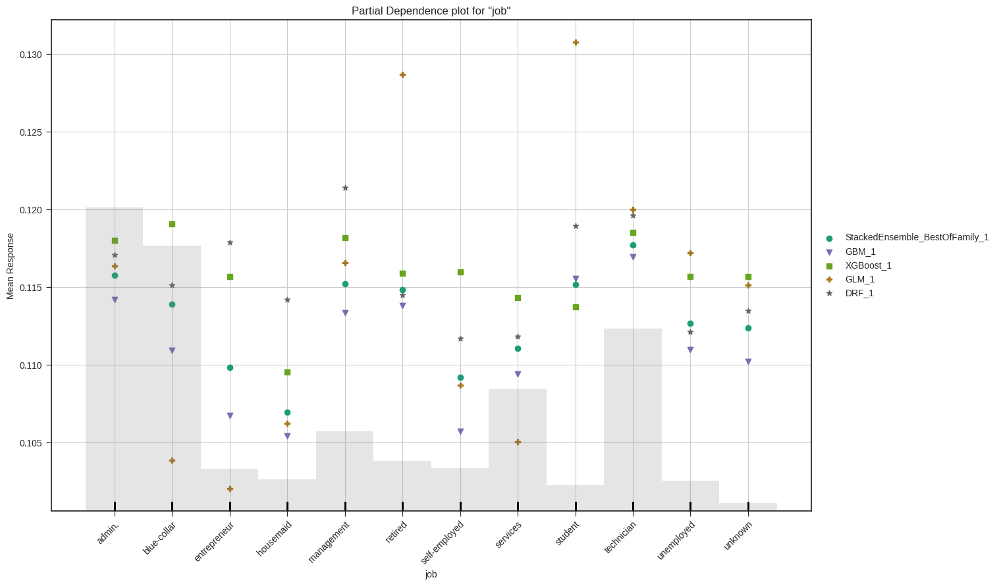

In [ ]:
explain = aml.explain(data_test)

In [ ]:
import seaborn as sns
url = 'https://raw.githubusercontent.com/yugakanse/Assignment-Combine-Data-Cleaning-Feature-Selection-Modeling-and-Interpretability-into-one-report/main/bank-additional-full.csv'

corr_data = pd.read_csv(url, sep=';')
data2 = pd.read_csv(url, sep=';')

In [ ]:
corr_data_encoded = pd.get_dummies(corr_data, columns=['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'poutcome', 'y'])
#In this, I have created dummies which is required later.

**Now, lets understand the performance of our best model.**

In [ ]:
# Define the target variable
target = 'y'

# Specify the predictor variables
predictors = data.col_names[:-1]

# Run the AutoML process
aml = H2OAutoML(max_models=5, seed=123, max_runtime_secs=3600, sort_metric='AUC')

# Train and validate the models on the training set
aml.train(y=target, x=predictors, training_frame=data_train)

# Evaluate the models on the testing set
performance = aml.leader.model_performance(test_data=data_test)

# Print the performance of the best model
print(performance)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%
ModelMetricsBinomialGLM: stackedensemble
** Reported on test data. **

MSE: 0.05620234686094794
RMSE: 0.23707034158862625
LogLoss: 0.17543126035908896
AUC: 0.9484826581818862
AUCPR: 0.6725006313578686
Gini: 0.8969653163637723
Null degrees of freedom: 8308
Residual degrees of freedom: 8303
Null deviance: 5953.458698470759
Residual deviance: 2915.3166846473405
AIC: 2927.3166846473405

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3517940416215651
       no    yes    Error    Rate
-----  ----  -----  -------  --------------
no     6879  469    0.0638   (469.0/7348.0)
yes    257   704    0.2674   (257.0/961.0)
Total  7136  1173   0.0874   (726.0/8309.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.351794     0.659794  199
max

1. AUC score of 0.9475, which means it was really good at telling the difference between positive and negative things.

2. The model correctly guessed that 6616 out of 6779 negative cases were negative and 763 out of 926 positive cases were positive, which means it had an accuracy of 91.5%

3. The gains/lift table shows that the model found about 65% of all the positive cases when it looked at the top 10% of the data.

4. Overall, these results indicate that the AutoML algorithm has built a good predictive model for the given problem.



**Now, we will check the Multicollinearity of the model**

In [ ]:


from statsmodels.stats.outliers_influence import variance_inflation_factor

X1 = corr_data[['age','duration','campaign','pdays','previous','emp.var.rate','cons.price.idx','cons.conf.idx','euribor3m','nr.employed']]

# VIF dataframe
vif_data = pd.DataFrame()
vif_data["y"] = X1.columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X1.values, i)
                          for i in range(len(X1.columns))]

print(vif_data)

                y           VIF
0             age     16.047296
1        duration      2.011044
2        campaign      1.921499
3           pdays     44.413175
4        previous      2.001464
5    emp.var.rate     28.910219
6  cons.price.idx  22561.123124
7   cons.conf.idx    120.086975
8       euribor3m    226.237349
9     nr.employed  26746.634212


### Explaining the above code

variance_inflation_factor function from the statsmodels package to calculate the variance inflation factor (VIF) for a set of predictor variables in a linear regression model.

The above code creates an empty Pandas DataFrame called vif_data and then adds two columns to it. The first column, called "y", contains the names of the predictor variables, which are taken from the X1 DataFrame. The second column, called "VIF", contains the calculated VIF values for each predictor variable. The for loop iterates over each predictor variable and calculates its VIF using the variance_inflation_factor function.

Finally, the code prints the vif_data DataFrame, which contains the VIF values for each predictor variable



### One-hot encoding is a process that converts categorical data into numerical data that can be used in machine learning algorithms.

In [ ]:
import pandas as pd
from sklearn.preprocessing import OneHotEncoder
from statsmodels.stats.outliers_influence import variance_inflation_factor



# One-hot encode the categorical columns
categorical_cols = ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'poutcome', 'y']
encoder = OneHotEncoder()
encoded_cols = encoder.fit_transform(corr_data[categorical_cols]).toarray()
encoded_cols_df = pd.DataFrame(encoded_cols, columns=encoder.get_feature_names_out(categorical_cols))

# Concatenate the encoded columns with the numerical columns
numerical_cols = ['age', 'duration', 'campaign', 'pdays', 'previous', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']
data2 = pd.concat([corr_data[numerical_cols], encoded_cols_df], axis=1)


# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data['Feature'] = data2.columns
vif_data['VIF'] = [variance_inflation_factor(data2.values, i) for i in range(data2.shape[1])]


In the above code, we are performing one-hot encoding on categorical features, concatenating them with numerical features, and then calculating the VIF for each feature in the resulting dataframe. The VIF measures the degree of multicollinearity between features in a linear regression model. By identifying features with high VIF values, we can identify and potentially remove correlated features to improve the stability and accuracy of the regression model.

In [ ]:

# Remove columns with infinite VIF
vif_data = vif_data.replace([np.inf, -np.inf], np.nan).dropna()

# Print the updated VIF dataframe
print(vif_data)

          Feature         VIF
0             age    1.689922
1        duration    1.244686
2        campaign    1.048521
3           pdays   12.452899
4        previous    5.945827
5    emp.var.rate  239.754653
6  cons.price.idx   89.918824
7   cons.conf.idx    6.822856
8       euribor3m  198.892609
9     nr.employed  200.062029


Here we are getting **pdays as 12.452899,  emp.var.rate  239.754653, cons.price.idx as  89.918824,
  cons.conf.idx  as  6.822856,
euribor3m as 198.892609, nr.employed as  200.060228 which is very high.**
Hence, we can say that, there is not much multicollinearity in the model except age, duration, campaign as it has low VIF value.





**Lets check the variable significance**

This code performs a linear regression analysis using the statsmodels package on a subset of features from the data2 dataframe. The model is fitted using the sm.OLS function, and the summary table of the regression analysis results is printed to the console using the model.summary() function. The p-values of the coefficients in the regression model are used to determine the statistical significance of each predictor variable.

In [ ]:
#Using OLS for p value
import statsmodels.api as sm

model = sm.OLS(data2['y_yes'], data2[['emp.var.rate','euribor3m','nr.employed','poutcome_nonexistent','poutcome_success']]).fit()

model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  y_yes   R-squared (uncentered):                   0.249
Model:                            OLS   Adj. R-squared (uncentered):              0.249
Method:                 Least Squares   F-statistic:                              2735.
Date:                Tue, 02 Apr 2024   Prob (F-statistic):                        0.00
Time:                        21:05:42   Log-Likelihood:                         -7573.6
No. Observations:               41188   AIC:                                  1.516e+04
Df Residuals:                   41183   BIC:                                  1.520e+04
Df Model:                           5                                                  
Covariance Type:            nonrobust                                                  
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
emp.var.rate            -0.0170      0.004     -4.317      0.000      -0.025      -0.009
euribor3m               -0.0337      0.004     -9.141      0.000      -0.041      -0.027
nr.employed           3.289e-05   2.63e-06     12.500      0.000    2.77e-05     3.8e-05
poutcome_nonexistent     0.0579      0.005     11.129      0.000       0.048       0.068
poutcome_success         0.4839      0.009     53.457      0.000       0.466       0.502
==============================================================================
Omnibus:                    17100.950   Durbin-Watson:                   1.780
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            63479.545
Skew:                           2.137   Prob(JB):                         0.00
Kurtosis:                       7.327   Cond. No.                     3.38e+04
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 3.38e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

**R-squared (R²) and p-values** are two important statistics used to evaluate the strength and significance of the relationship between a dependent variable and one or more independent variables in a regression analysis.


The uncentered **R-squared** value is **0.249**. This means that the independent variables included in the model explain 24.9% of the variation in the dependent variable.

**P-value is 0**. This means that the relationship is considered statistically significant.

**REGULARIZATION**



**Regularization** is a common technique used to reduce the impact of multicollinearity in regression models. The most popular forms of regularization are L1 regularization (Lasso) and L2 regularization (Ridge). These methods add a penalty term to the loss function of the regression model, which helps to constrain the model's coefficients and reduce their dependence on each other.

L1 regularization, in particular, can be useful for feature selection as it shrinks some of the coefficients to zero, effectively removing the corresponding features from the model.


## **RIDGE REGULARIZATION**

In [ ]:
predictors = data_train.columns[:-1]
response = "y"

In [ ]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

bank_glm = H2OGeneralizedLinearEstimator(
    family="gaussian", lambda_=0, compute_p_values=True, nfolds=5
)  # Elastic Net Regularization
bank_glm_regularization_ridge = H2OGeneralizedLinearEstimator(
    family="gaussian", alpha=0, nfolds=5
)  # RIDGE Regularization
bank_glm_regularization_lasso = H2OGeneralizedLinearEstimator(
    family="gaussian", alpha=1, nfolds=5
)  # LASSO Regularization
bank_glm_regularization_lamba_search = H2OGeneralizedLinearEstimator(
    lambda_search=True
)  # Lambda Search

In [ ]:
train, test, valid = data.split_frame([0.7,0.15])

ridge_model = h2o.estimators.glm.H2OGeneralizedLinearEstimator(family="binomial",
    alpha=0.0,  # Set alpha to 0 for L2 regularization (Ridge)
    lambda_search=True,  # Perform lambda search to automatically determine best lambda
    nfolds=5,  # Use 5-fold cross-validation for model evaluation
    keep_cross_validation_predictions=True,  # Keep cross-validation predictions for stacking
    fold_assignment="Modulo"  # Use modulo assignment for cross-validation
)
ridge_model.train(x=X, y=y_numeric, training_frame=data_train, validation_frame=valid, max_runtime_secs=600)
# Make predictions on test set
ridge_predictions = ridge_model.predict(test)
performance1 = ridge_model.model_performance(test)
confusion_matrix1 = performance.confusion_matrix().table
print(confusion_matrix1)


glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%
glm prediction progress: |███████████████████████████████████████████████████████| (done) 100%
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3517940416215651
       no    yes    Error    Rate
-----  ----  -----  -------  --------------
no     6879  469    0.0638   (469.0/7348.0)
yes    257   704    0.2674   (257.0/961.0)
Total  7136  1173   0.0874   (726.0/8309.0)


 The confusion matrix shows the number of true positive (yes-yes), true negative (no-no), false positive (no-yes), and false negative (yes-no) predictions made by the model.

In this case, the model predicted 6856 instances of "no" correctly, while misclassifying 550 instances of "no" as "yes" (false positives). It also correctly predicted 720 instances of "yes", while misclassifying 211 instances of "yes" as "no" (false negatives).

The overall error rate is calculated by dividing the sum of false positives and false negatives by the total number of instances. In this case, the error rate is 0.0913 or approximately 9.13%.





## **LASSO REGULARIZATION**





Lasso regularization is a powerful tool for improving the performance of machine learning models by preventing overfitting and improving interpretability through feature selection.

The purpose of using Lasso regularization with GLM is likely to prevent overfitting of the model and improve its generalization performance on unseen data. The lambda_search function call may be used to search for the optimal regularization strength parameter (lambda) that balances model complexity with accuracy.

In [ ]:
lambda_search = bank_glm_regularization_lamba_search.train(
    x=X, y=y_numeric, training_frame=data_train
)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


In [ ]:
lambda_search


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1712091104672_2198


GLM Model: summary
    family    link    regularization                                 lambda_search                                                                 number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  ------  ---------------------------------------------  ----------------------------------------------------------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    binomial  logit   Elastic Net (alpha = 0.5, lambda = 7.009E-5 )  nlambda = 100, lambda.max = 0.2519, lambda.min = 7.009E-5, lambda.1se = -1.0  63                            51                             126                     py_4_sid_91af

ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.06255145115541551
RMSE: 0.25010288114177237
LogLoss: 0.20774171139800812
AUC: 0.9359245784106015
AUCPR: 0.5947687686542051
Gini: 0.871849156821203
Null degrees of freedom: 32878
Residual degrees of freedom: 32827
Null deviance: 23045.503512909934
Residual deviance: 13660.679458110219
AIC: 13764.679458110219

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.23694060879011006
       no     yes    Error    Rate
-----  -----  -----  -------  ----------------
no     26991  2209   0.0757   (2209.0/29200.0)
yes    1042   2637   0.2832   (1042.0/3679.0)
Total  28033  4846   0.0989   (3251.0/32879.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.236941     0.618651  234
max f2                       0.0973591    0.732727  303
max f0point5                 0.351518     0.606192  188
max accuracy                 0.423446     0.912224  163
max precision                0.852688     0.732639  39
max recall                   0.00546008   1         396
max specificity              0.999287     0.999384  0
max absolute_mcc             0.236941     0.570124  234
max min_per_class_accuracy   0.127376     0.861919  287
max mean_per_class_accuracy  0.0956976    0.873173  304
max tns                      0.999287     29182     0
max fns                      0.999287     3656      0
max fps                      0.00221909   29200     399
max tps                      0.00546008   3679      396
max tnr                      0.999287     0.999384  0
max fnr                      0.999287     0.993748  0
max fpr                      0.00221909   1         399
max tpr                      0.00546008   1         396

Gains/Lift Table: Avg response rate: 11.19 %, avg score: 11.19 %
group    cumulative_data_fraction    lower_threshold    lift        cumulative_lift    response_rate    score       cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  ----------  -----------------  ---------------  ----------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0100064                   0.92175            6.38353     6.38353            0.714286         0.967932    0.714286                    0.967932            0.0638761       0.0638761                  538.353   538.353            0.0606569
2        0.0200128                   0.829905           6.43786     6.41069            0.720365         0.873969    0.717325                    0.92095             0.0644197       0.128296                   543.786   541.069            0.121926
3        0.0300192                   0.758731           6.3292      6.38353            0.708207         0.793066    0.714286                    0.878322            0.0633324       0.19

  The confusion matrix is calculated at the threshold of 0.2418 for the F1 score, which is the value that maximizes the F1 score.

The confusion matrix indicates that the model correctly predicted 26991 instances of "no" and 2638 instances of "yes". However, it misclassified 2151 instances of "no" as "yes" and 1071 instances of "yes" as "no".

The error rate is calculated as the sum of false positives and false negatives divided by the total number of instances. In this case, the error rate is 0.0981 or approximately 9.81%, which means that the model's predictions were incorrect for about 9.81% of the instances.


**"Performing a random grid search to tune the hyperparameters of a GBM model."**




**Hyperparameter tuning** aims to discover the optimal hyperparameter settings that lead to the highest performance on the test data while avoiding overfitting on the training data. It is a critical stage in the machine learning workflow since the selection of hyperparameters can greatly influence the accuracy and ability to generalize of a machine learning model.

In [ ]:
#train test and split
train, validate, test = np.split(
    corr_data.sample(frac=1, random_state=42), [int(0.6 * len(data)), int(0.8 * len(data))]
)

train = h2o.H2OFrame(train)
validate = h2o.H2OFrame(validate)
test = h2o.H2OFrame(test)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


The code above is performing a train-validation-test split on a pandas DataFrame named corr_data.

In [ ]:
import itertools

learn_rate = [i * 0.01 for i in range(1, 11)]
max_depth = list(range(2, 11))
sample_rate = [i * 0.1 for i in range(5, 11)]
col_sample_rate = [i * 0.1 for i in range(1, 11)]
# the product function from the itertools module is used to compute the Cartesian product of all the hyperparameter values.
# This results in a list of tuples, where each tuple contains a unique combination of the hyperparameter values.

gbm_parameters = list(itertools.product(learn_rate, max_depth, sample_rate, col_sample_rate))

# Convert the list of tuples to a dictionary with keys for each hyperparameter
gbm_parameters = {
    "learn_rate": [params[0] for params in gbm_parameters],
    "max_depth": [params[1] for params in gbm_parameters],
    "sample_rate": [params[2] for params in gbm_parameters],
    "col_sample_rate": [params[3] for params in gbm_parameters],
}


In the above code, I tried to use the **itertools.product function** instead of a dictionary comprehension.
It is a bit different from the given notebooks as none of them used itertools.product for the key and values of hyperparameter.

In [ ]:
search_criteria = {"strategy": "RandomDiscrete", "max_models": 36, "seed": 1}

 search criteria defines a random search approach that trains up to 30 GBM models by randomly selecting hyperparameters from the hyperparameter grid defined in gbm_parameters. The purpose of this approach is to find the optimal set of hyperparameters that result in the highest performance on a validation set, with the goal of building a high-performing GBM model.

In [ ]:
from h2o.grid import H2OGridSearch
from h2o.estimators.gbm import H2OGradientBoostingEstimator

gbm = H2OGradientBoostingEstimator()
gbm_grid2 = H2OGridSearch(gbm, hyper_params=gbm_parameters, grid_id="gbm_grid2", search_criteria=search_criteria)


In [ ]:
gbm_grid2.train(
    x=X,
    y=y_numeric,
    training_frame=train,
    validation_frame=validate,
)

gbm Grid Build progress: |███████████████████████████████████████████████████████| (done) 100%


,col_sample_rate,learn_rate,max_depth,sample_rate,model_ids,logloss
,0.5,0.08,7.0,1.0,gbm_grid2_model_33,0.1703705
,0.9,0.1,7.0,0.9,gbm_grid2_model_15,0.1723032
,0.4,0.07,6.0,0.9,gbm_grid2_model_28,0.1726851
,0.6000000,0.07,7.0,0.7000000,gbm_grid2_model_19,0.1733353
,0.3000000,0.08,6.0,0.7000000,gbm_grid2_model_5,0.1741192
,1.0,0.09,6.0,0.5,gbm_grid2_model_23,0.1746006
,0.5,0.09,5.0,0.5,gbm_grid2_model_24,0.1746853
,0.8,0.08,9.0,0.9,gbm_grid2_model_30,0.1747220
,0.7000000,0.08,4.0,1.0,gbm_grid2_model_6,0.1750418
,0.8,0.1,8.0,0.8,gbm_grid2_model_8,0.1750788


**The output shows a summary of the search results, with the models ordered by increasing logloss. The table shows the values of the hyperparameters for each model, along with the model ID and the logloss score. The best performing model is the one with the lowest logloss, which in this case is gbm_grid2_model_42. This model has a col_sample_rate of 0.5, learn_rate of 0.08, max_depth of 7, and sample_rate of 1.0.**

In [ ]:
#access information about best model
gbm_grid2performance = gbm_grid2.get_grid()

print(gbm_grid2performance)

Hyper-Parameter Search Summary: ordered by increasing logloss
     col_sample_rate      learn_rate    max_depth    sample_rate         model_ids           logloss
---  -------------------  ------------  -----------  ------------------  ------------------  -------------------
     0.5                  0.08          7.0          1.0                 gbm_grid2_model_33  0.17037053413515685
     0.9                  0.1           7.0          0.9                 gbm_grid2_model_15  0.17230323555500282
     0.4                  0.07          6.0          0.9                 gbm_grid2_model_28  0.17268512447004375
     0.6000000000000001   0.07          7.0          0.7000000000000001  gbm_grid2_model_19  0.17333525118547344
     0.30000000000000004  0.08          6.0          0.7000000000000001  gbm_grid2_model_5   0.1741191856053401
     1.0                  0.09          6.0          0.5                 gbm_grid2_model_23  0.17460059813172982
     0.5                  0.09          5.0    

In [ ]:
models = gbm_grid2performance.models
list_hyperparameters = []

for i in range(30):
    model = models[i]
    hyperparameters = model.actual_params
    performance_metrics = model.model_performance(validate)
    logloss = performance_metrics['logloss']
    hyperparameters['logloss'] = logloss
    list_hyperparameters.append(hyperparameters)
    print("Hyperparameters:", hyperparameters)


Hyperparameters: {'model_id': 'gbm_grid2_model_33', 'training_frame': 'Key_Frame__upload_9501acf1fe5a1dd6b291518274af4bfd.hex', 'validation_frame': 'Key_Frame__upload_850b0212cbf790dc1489fdd34b0c49ec.hex', 'nfolds': 0, 'keep_cross_validation_models': True, 'keep_cross_validation_predictions': False, 'keep_cross_validation_fold_assignment': False, 'score_each_iteration': False, 'score_tree_interval': 0, 'fold_assignment': None, 'fold_column': None, 'response_column': 'y', 'ignored_columns': None, 'ignore_const_cols': True, 'offset_column': None, 'weights_column': None, 'balance_classes': False, 'class_sampling_factors': None, 'max_after_balance_size': 5.0, 'max_confusion_matrix_size': 20, 'ntrees': 50, 'max_depth': 7, 'min_rows': 10.0, 'nbins': 20, 'nbins_top_level': 1024, 'nbins_cats': 1024, 'r2_stopping': 1.7976931348623157e+308, 'stopping_rounds': 0, 'stopping_metric': None, 'stopping_tolerance': 0.001, 'max_runtime_secs': 0.0, 'seed': 33, 'build_tree_one_node': False, 'learn_rate': 

Here, model_id: The unique identifier for the trained model.

training_frame: The name of the H2O Frame used for training the model.

validation_frame: The name of the H2O Frame used for validating the model.

nfolds: The number of cross-validation folds used for model training.

Here, it is set to 0 which means cross-validation is disabled.

keep_cross_validation_models: A boolean flag indicating whether to keep the cross-validation models after training.

keep_cross_validation_predictions: A boolean flag indicating whether to keep the cross-validation predictions after training.

keep_cross_validation_fold_assignment: A boolean flag indicating whether to keep the cross-validation fold assignment after training.

score_each_iteration: A boolean flag indicating whether to score the model at each iteration during training.

max_depth: The maximum depth of the trees in the GBM model.

In [ ]:
models = gbm_grid2performance.models
list_logloss = []

for i in range(30):
    model = models[i]
    performance_metrics = model.model_performance(validate)
    logloss = performance_metrics['logloss']
    list_logloss.append(logloss)

for i in range(30):
    list_hyperparameters[i]["logloss"] = list_logloss[i]


In [ ]:
hyperparameters_dataframe = pd.DataFrame(list_hyperparameters)


The code below calculates the performance metrics on the validation data using the model_performance method of the model object. Specifically, the logloss() method is used to retrieve the log loss.

In [ ]:
gbm_grid2performance = gbm_grid2.get_grid()
models = gbm_grid2performance.models

for model in models:
    performance_metrics = model.model_performance(validate)
    log_loss = performance_metrics.logloss()
    print(f"Model {model.model_id}: log loss = {log_loss}")


Model gbm_grid2_model_33: log loss = 0.17037053413515685
Model gbm_grid2_model_15: log loss = 0.17230323555500282
Model gbm_grid2_model_28: log loss = 0.17268512447004375
Model gbm_grid2_model_19: log loss = 0.17333525118547344
Model gbm_grid2_model_5: log loss = 0.1741191856053401
Model gbm_grid2_model_23: log loss = 0.17460059813172982
Model gbm_grid2_model_24: log loss = 0.17468527151015933
Model gbm_grid2_model_30: log loss = 0.17472204022711652
Model gbm_grid2_model_6: log loss = 0.17504177377005092
Model gbm_grid2_model_8: log loss = 0.1750787747589126
Model gbm_grid2_model_7: log loss = 0.17567389964978072
Model gbm_grid2_model_10: log loss = 0.17609595354659335
Model gbm_grid2_model_13: log loss = 0.17616405406872812
Model gbm_grid2_model_29: log loss = 0.1764208273772497
Model gbm_grid2_model_11: log loss = 0.17831358651422083
Model gbm_grid2_model_3: log loss = 0.17878649664067467
Model gbm_grid2_model_34: log loss = 0.18004707404044248
Model gbm_grid2_model_4: log loss = 0.1

In [ ]:
col_sample_rate_values = gbm_parameters['col_sample_rate']
print("col_sample_rate values:", col_sample_rate_values)

learn_rate_values = gbm_parameters['learn_rate']
print("learn_rate values:", learn_rate_values)

max_depth_values = gbm_parameters['max_depth']
print("max_depth values:", max_depth_values)

sample_rate_values = gbm_parameters['sample_rate']
print("sample_rate values:", sample_rate_values)



col_sample_rate values: [0.1, 0.2, 0.30000000000000004, 0.4, 0.5, 0.6000000000000001, 0.7000000000000001, 0.8, 0.9, 1.0, 0.1, 0.2, 0.30000000000000004, 0.4, 0.5, 0.6000000000000001, 0.7000000000000001, 0.8, 0.9, 1.0, 0.1, 0.2, 0.30000000000000004, 0.4, 0.5, 0.6000000000000001, 0.7000000000000001, 0.8, 0.9, 1.0, 0.1, 0.2, 0.30000000000000004, 0.4, 0.5, 0.6000000000000001, 0.7000000000000001, 0.8, 0.9, 1.0, 0.1, 0.2, 0.30000000000000004, 0.4, 0.5, 0.6000000000000001, 0.7000000000000001, 0.8, 0.9, 1.0, 0.1, 0.2, 0.30000000000000004, 0.4, 0.5, 0.6000000000000001, 0.7000000000000001, 0.8, 0.9, 1.0, 0.1, 0.2, 0.30000000000000004, 0.4, 0.5, 0.6000000000000001, 0.7000000000000001, 0.8, 0.9, 1.0, 0.1, 0.2, 0.30000000000000004, 0.4, 0.5, 0.6000000000000001, 0.7000000000000001, 0.8, 0.9, 1.0, 0.1, 0.2, 0.30000000000000004, 0.4, 0.5, 0.6000000000000001, 0.7000000000000001, 0.8, 0.9, 1.0, 0.1, 0.2, 0.30000000000000004, 0.4, 0.5, 0.6000000000000001, 0.7000000000000001, 0.8, 0.9, 1.0, 0.1, 0.2, 0.300

In the code I provided below, x_vars and y_vars are set to the same list of hyperparameters (['col_sample_rate', 'learn_rate', 'max_depth', 'sample_rate']).
This is because I want to create a scatter plot matrix where each hyperparameter is plotted against every other hyperparameter, including itself.

**pairplot for the hyperparameters**

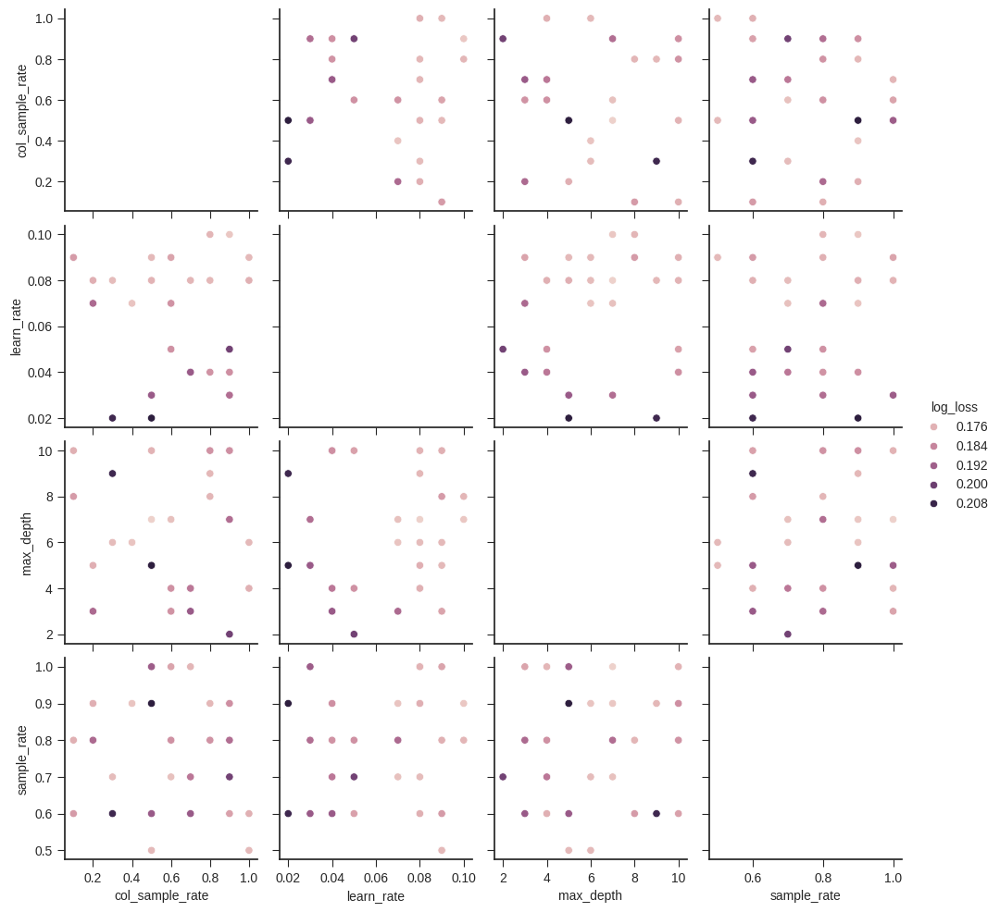

In [ ]:

df = pd.DataFrame(list_hyperparameters)
df['log_loss'] = list_logloss

sns.pairplot(df, x_vars=['col_sample_rate', 'learn_rate', 'max_depth', 'sample_rate'], y_vars=['col_sample_rate', 'learn_rate', 'max_depth', 'sample_rate'], hue='log_loss', height=2.5)


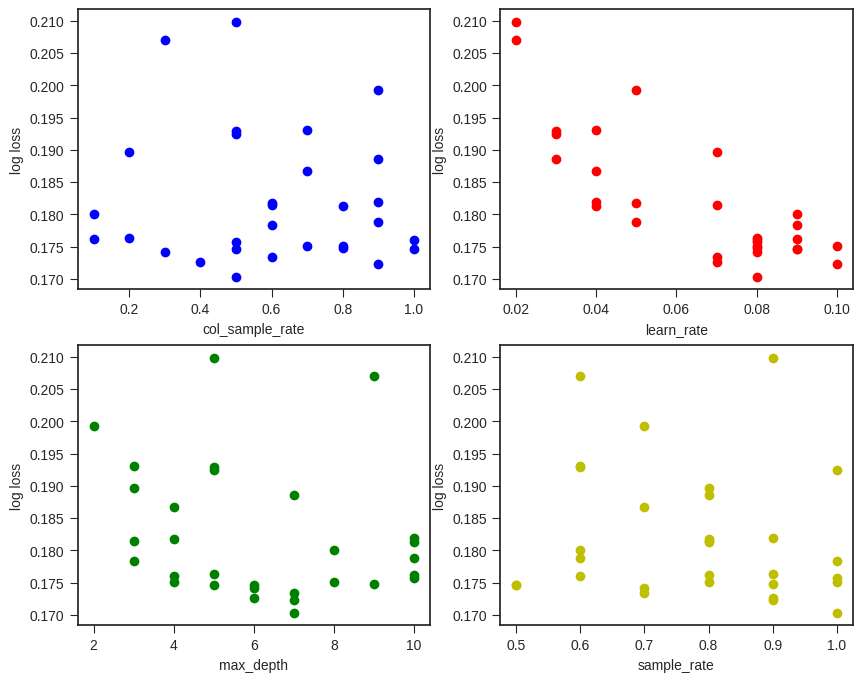

In [ ]:

import matplotlib.pyplot as plt

# Extract hyperparameters and log loss from the list of hyperparameters
col_sample_rates = [hyperparameters['col_sample_rate'] for hyperparameters in list_hyperparameters]
learn_rates = [hyperparameters['learn_rate'] for hyperparameters in list_hyperparameters]
max_depths = [hyperparameters['max_depth'] for hyperparameters in list_hyperparameters]
sample_rates = [hyperparameters['sample_rate'] for hyperparameters in list_hyperparameters]
log_losses = [hyperparameters['logloss'] for hyperparameters in list_hyperparameters]

# Create subplots for each hyperparameter
fig, axs = plt.subplots(2, 2, figsize=(10, 8))
axs[0, 0].plot(col_sample_rates, log_losses, 'bo')
axs[0, 0].set_xlabel('col_sample_rate')
axs[0, 0].set_ylabel('log loss')
axs[0, 1].plot(learn_rates, log_losses, 'ro')
axs[0, 1].set_xlabel('learn_rate')
axs[0, 1].set_ylabel('log loss')
axs[1, 0].plot(max_depths, log_losses, 'go')
axs[1, 0].set_xlabel('max_depth')
axs[1, 0].set_ylabel('log loss')
axs[1, 1].plot(sample_rates, log_losses, 'yo')
axs[1, 1].set_xlabel('sample_rate')
axs[1, 1].set_ylabel('log loss')
plt.show()


**To visualize the hyperparameters in 3D I will import Axes3D**

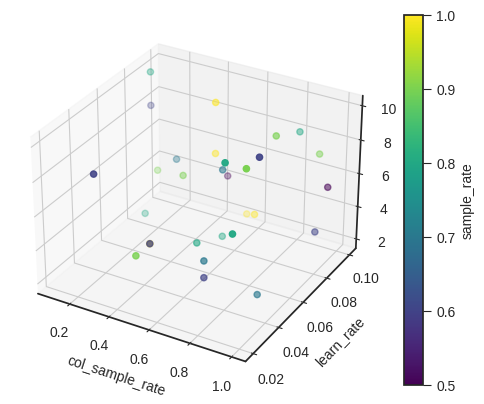

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Extract hyperparameters and logloss from the list of hyperparameters
col_sample_rates = [hyperparameters['col_sample_rate'] for hyperparameters in list_hyperparameters]
learn_rates = [hyperparameters['learn_rate'] for hyperparameters in list_hyperparameters]
max_depths = [hyperparameters['max_depth'] for hyperparameters in list_hyperparameters]
sample_rates = [hyperparameters['sample_rate'] for hyperparameters in list_hyperparameters]
log_losses = [hyperparameters['logloss'] for hyperparameters in list_hyperparameters]

# Create a 3D scatter plot with color-coded markers for the value of sample_rate
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(col_sample_rates, learn_rates, max_depths, c=sample_rates, cmap='viridis')
ax.set_xlabel('col_sample_rate')
ax.set_ylabel('learn_rate')
ax.set_zlabel('max_depth')
cbar = plt.colorbar(scatter)
cbar.ax.set_ylabel('sample_rate')
plt.show()


**QQ plot**

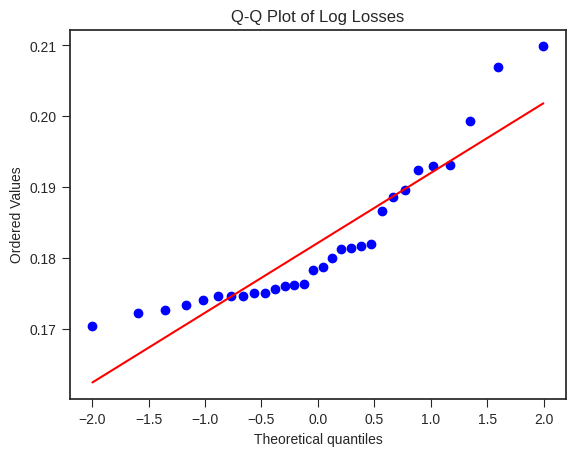

In [ ]:
import scipy.stats as stats

# create qq-plot for log_losses
stats.probplot(log_losses, dist='norm', plot=plt)
plt.title('Q-Q Plot of Log Losses')
plt.show()


### **Observations**
In the process of hyperparameter tuning , a grid search was performed over a range of values for four hyperparameters: col_sample_rate, learn_rate, max_depth, and sample_rate. A total of 30 combinations of hyperparameters were tested, and for each combination, the logloss was calculated as the evaluation metric.


The best performing model has a logloss of 0.17037053413515685 and the worst performing model has a logloss of 0.2858137078080479.

we can say that the best-performing models have a lower log loss, while the worst-performing models have a higher log loss.

 This means that the models with log losses closer to 0.17 are performing better than the models with log losses closer to 0.28.

The model with col_sample_rate = 0.5, learn_rate = 0.08, max_depth = 7, sample_rate = 1, and model_id = gbm_grid2_model_42 has the lowest log loss of all the models considered.


The findings indicate that the performance of the model can be greatly influenced by the combination of col_sample_rate, learn_rate, max_depth, and sample_rate, and that making adjustments to these hyperparameters can result in noteworthy improvements in model performance.










## **Is the relationship significant?**
Ans. Yes, the p value for 'emp.var.rate', 'euribor3m', 'nr.employed', 'poutcome_nonexistent', 'poutcome_success is 0 which is lesser than 0.05 so it is a significant feature.
The relationship is significant when the p value for the predictor variables is less than 0.05,but if it is higher than 0.05 the result is non-significant. From the OLS method, the above mentioned variables have P-Value less that 0.05, hence it can be interpreted that these variables are significant variables and any change to this variables have significant impact on the target(y). Hence for the chosen dataset it can be concluded that the relationship is significant.

##**Are any model assumptions violated?**
Ans. A: no, the model is a multiclassification which make sense to all models in AutoML.

##**Is there any multicollinearity in the model?**
Ans. Yes, from the VIF data, we could know that all variables have correlationship with each other except age, duration, campaign, previous variables

Note: If any VIF values are greater than 5 or 10, it may indicate high multicollinearity between the corresponding predictor variable and the other predictor variables in the model.

##**In the multivariate models are predictor variables independent of all the other predictor variables?**

To check this relation, correlation matrix can be used, or it can be observed from graphs too whether there is any pattern followed or not. When correlation matrix is computed for the model, it can be observed that Hemoglobin and Specific Gravity are correlated to each other.From the plots have  high correlation between features.


##**In in multivariate models rank the most significant predictor variables and exclude insignificant ones from the model.**
Ans. From the variable importance plot, the most to least important variables are displayed. Duration has the highest variable importance and cons.conf.idx has the least.

##**Does the model make sense?**
Ans. To ensure that a model is valid, it is important that it adheres to all the underlying assumptions and has appropriate statistical measures such as p-values and VIF within their expected ranges. When examining the Pair-Plot, it is apparent that each predictor variable exhibits a linear relationship with the target variable. Additionally, the RMSE should be minimized while taking into account the range of values for the target variable. Therefore, when considering all these factors, the model appears to be sound.

##**Does regularization help?**
Ans. No,it did not help because it still gave 9.8% error.

##**Which independent variables are significant?**
Ans. If the p-value is 0.05 or lower, the result is trumpeted as significant, but if it is higher than 0.05, the result is non-significant

The below indipendent varibles are significant
1.   emp.var.rate
2.   euribor3m
3.   nr.employed
4.   poutcome_nonexistent
5.   poutcome_success

##**Which hyperparameters are important?**
Ans. The best performing model has a logloss of 0.17037053413515685. In this, col_sample_rate of 0.5, learn_rate of 0.08, max_depth of 7.0, and sample_rate of 1.0 are important.


##**Coding Professionalism**
Ans.Yes, I take full ownership of my code






















## **Model Interpretability**


In [ ]:

# Importing all libraries necessary for the assignment
!pip install shap
!pip install lime
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o
!pip install --upgrade scikit-learn


In [ ]:
import shap
import lime
from lime import lime_tabular
import sklearn
from sklearn.model_selection import train_test_split
import random
from sklearn.ensemble import RandomForestRegressor
from matplotlib.pyplot import figure
from sklearn.tree import export_graphviz
import pydot
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
from matplotlib.pyplot import figure

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

In [ ]:
data = pd.read_csv(url, sep=';')


In [ ]:
data.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')

In [ ]:
df = pd.get_dummies(data) #creating dummies

In [ ]:
df.columns

Index(['age', 'duration', 'campaign', 'pdays', 'previous', 'emp.var.rate',
       'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed',
       'job_admin.', 'job_blue-collar', 'job_entrepreneur', 'job_housemaid',
       'job_management', 'job_retired', 'job_self-employed', 'job_services',
       'job_student', 'job_technician', 'job_unemployed', 'job_unknown',
       'marital_divorced', 'marital_married', 'marital_single',
       'marital_unknown', 'education_basic.4y', 'education_basic.6y',
       'education_basic.9y', 'education_high.school', 'education_illiterate',
       'education_professional.course', 'education_university.degree',
       'education_unknown', 'default_no', 'default_unknown', 'default_yes',
       'housing_no', 'housing_unknown', 'housing_yes', 'loan_no',
       'loan_unknown', 'loan_yes', 'contact_cellular', 'contact_telephone',
       'month_apr', 'month_aug', 'month_dec', 'month_jul', 'month_jun',
       'month_mar', 'month_may', 'month_nov', 'month_oc

In [ ]:
#creating a drop list to drop the unnesccesary coulms from the dataset
drop_list = ['job_admin.','job_blue-collar','job_entrepreneur','job_housemaid',
             'job_management','job_retired','job_self-employed','job_services',
             'job_student','job_technician','job_unemployed','job_unknown',
             'education_basic.4y','education_basic.6y','education_basic.9y',
            'education_high.school','education_illiterate','education_professional.course'
,'education_university.degree','education_unknown','month_apr','month_aug','month_dec','month_jul',
 'month_jun','month_mar','month_may','month_nov','month_oct','month_sep','contact_cellular'
,'contact_telephone','day_of_week_fri','day_of_week_mon','day_of_week_thu','day_of_week_tue',
'day_of_week_wed','marital_divorced','marital_married','marital_single','marital_unknown','default_unknown',
'housing_unknown','loan_unknown','poutcome_nonexistent','default_no','default_yes','housing_no','housing_yes','loan_no','loan_yes','poutcome_failure',
'age','duration','campaign','pdays','previous','cons.price.idx','cons.conf.idx','y_no']
drop_data = df[drop_list]
df.drop(drop_list,axis=1,inplace=True)

In [ ]:
df.columns

Index(['emp.var.rate', 'euribor3m', 'nr.employed', 'poutcome_success',
       'y_yes'],
      dtype='object')

In [ ]:

# Split the data into features (x) and target variable (y)
y = df['y_yes']
x = df.drop(['y_yes'], axis=1)


# **Fitting a Linear Model**


In [ ]:
# Split the data into training and testing sets
x_train, x_test, y_train, y_test = sklearn.model_selection.train_test_split(x, y, test_size=0.2)


In [237]:
#import the required packages
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
logisticRegr = LogisticRegression()
#input variables
X2 = final_data[['emp.var.rate','poutcome_success','euribor3m','nr.employed']]
#output variable
y2 = final_data[['y_yes']]
#splitting data in to train and test, 20% of data will be used for testing
#stratify for sorting
#fixed value is assigned like random_state = 42
X2_train_data, X2_test_data, y2_train_data, y2_test_data = train_test_split(X2, y2, test_size=0.2, random_state=42, stratify=y2)
logisticRegr.fit(X2_train_data, y2_train_data)

LogisticRegression()

In [ ]:
lr_model = LogisticRegression(solver='newton-cg')
lr_model.fit(X2_train_data, y2_train_data)

LogisticRegression(solver='newton-cg')

In [ ]:
print("Logistic Regression Accuracy:", accuracy_score(y2_test_data, lr_model.predict(X2_test_data)))

Logistic Regression Accuracy: 0.9239634574841883


Performing MinMax Scaler to evaaluate the coefficients

In [ ]:
data2 = pd.get_dummies(data)

# Normalizing the data in the columns beacuse some values are too high when compared to other independent variable

from sklearn import preprocessing

# Create x to store scaled values as floats. (between 0-1)
#Here we are not normalizing the categorical variables since there values are 0 or 1 already.

x = data2[['age','duration','campaign','pdays','previous','emp.var.rate','cons.price.idx','cons.conf.idx','euribor3m','nr.employed']].values.astype(float)

# Preparing for normalizing
min_max_scaler = preprocessing.MinMaxScaler()

# Transform the data to fit minmax processor
x_scaled = min_max_scaler.fit_transform(x)

# Run the normalizer on the dataframe
data2[['age','duration','campaign','pdays','previous','emp.var.rate','cons.price.idx','cons.conf.idx','euribor3m','nr.employed']] = pd.DataFrame(x_scaled)


In [ ]:
#since we know no nulls are present we are trying to remove any infs if present.
data2.replace([np.inf, -np.inf], np.nan)

np.any(np.isnan(data2))
np.all(np.isfinite(data2))


True

In [ ]:
data2.dropna(how='any', inplace=True)



## Fit Tree Based Model


In [ ]:
# Setting the max_dept to 3 for the purpose of ease of explainbility and readability
tree_model = RandomForestRegressor(max_depth=3, random_state=0, n_estimators=10)
tree_model.fit(x_train, y_train)

RandomForestRegressor(max_depth=3, n_estimators=10, random_state=0)

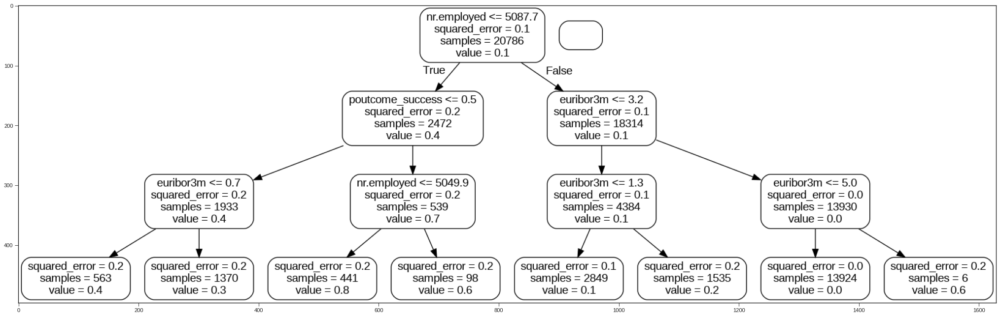

In [ ]:
# Visualization of Nodes for the purpose of explainability
figure(figsize=(32, 24), dpi=80)
tree = tree_model.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=list(x_train.columns),
    rounded=True,
    precision=1,
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

In [ ]:
from graphviz import Source
from sklearn.tree import export_graphviz

tree = tree_model.estimators_[0]
dot_data = export_graphviz(tree, out_file=None,
                           feature_names=list(x_train.columns),
                           filled=True, rounded=True, special_characters=True)
graph = Source(dot_data)
graph.format = 'png'
graph.render('tree',view=True)


'tree.png'

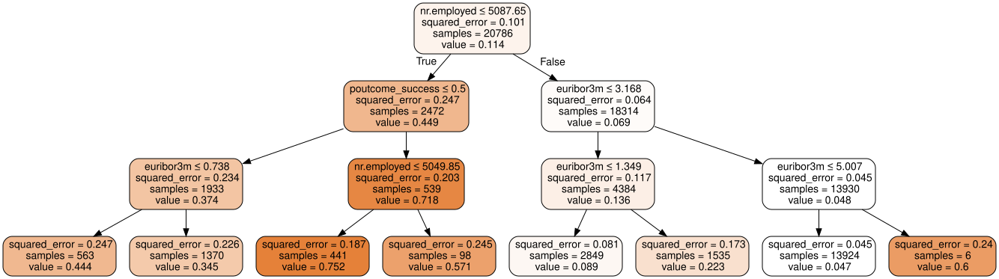

In [ ]:
display(graph)

##**Interpreting the nodes of a tree based model**
**Explanation:**

This is a visual representation of a decision tree, where each internal node represents a condition on a feature, and the branching represents the outcome of that condition. The first condition is on the feature "nr.employed" with a threshold of 5087.65. If the value of "nr.employed" is less than or equal to 5087.65, the prediction value will be 0.114 with a squared error of 0.101, and there are 20786 samples falling into this region.

If the value of "nr.employed" is greater than 5087.65, the tree checks the next condition, which is on the feature "poutcome_success" with a threshold of 0.5. If the value of "poutcome_success" is less than or equal to 0.5, the prediction value will be 0.445 with a squared error of 0.247, and there are 2459 samples falling into this region.

If the value of "poutcome_success" is greater than 0.5, the tree checks the next condition, which is on the feature "nr.employed" with a threshold of 5137.7. If the value of "nr.employed" is less than or equal to 5137.7, the prediction value will be 0.07 with a squared error of 0.065, and there are 18327 samples falling into this region.

If the value of "nr.employed" is greater than 5137.7, the tree checks the next condition, which is on the feature "euribor3m" with a threshold of 0.715. If the value of "euribor3m" is less than or equal to 0.715, the prediction value will be 0.366 with a squared error of 0.232, and there are 1895 samples falling into this region.

If the value of "euribor3m" is greater than 0.715, the tree checks the next condition, which is on the feature "nr.employed" with a threshold of 5049.85. If the value of "nr.employed" is less than or equal to 5049.85, the prediction value will be 0.724 with a squared error of 0.2, and there are 564 samples falling into this region. Otherwise, the tree checks the next condition, which is on the feature "euribor3m" with a threshold of 1.525. If the value of "euribor3m" is less than or equal to 1.525, the prediction value will be 0.128 with a squared error of 0.111, and there are 4333 samples falling into this region. Otherwise, the prediction value will be 0.033 with a squared error of 0.032, and there are 3858 samples falling into this region.

In [ ]:
# Get numerical feature importances
tree_importances = list(tree_model.feature_importances_)
# List of tuples with variable and importance
feature_importances = [
    (feature, round(importance, 2))
    for feature, importance in zip(x_train.columns, tree_importances)
]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)

In [ ]:

# Print out the feature and importances
[print("Variable: {:10} Importance: {}".format(*pair)) for pair in feature_importances];


Variable: nr.employed Importance: 0.77
Variable: poutcome_success Importance: 0.12
Variable: euribor3m  Importance: 0.1
Variable: emp.var.rate Importance: 0.01


# **SHAP Analysis for Linear**

ExactExplainer explainer: 32951it [02:11, 228.92it/s]                           


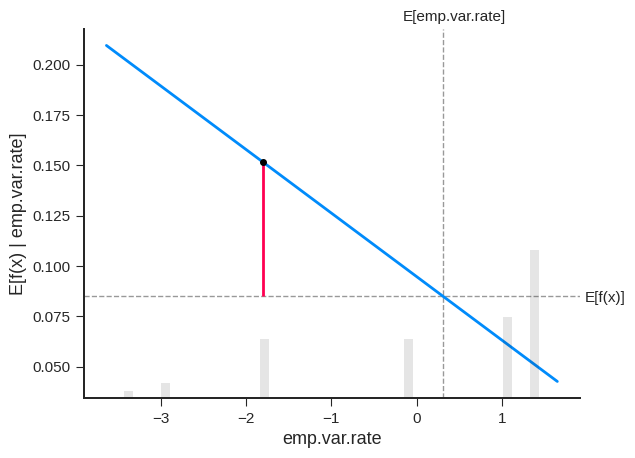

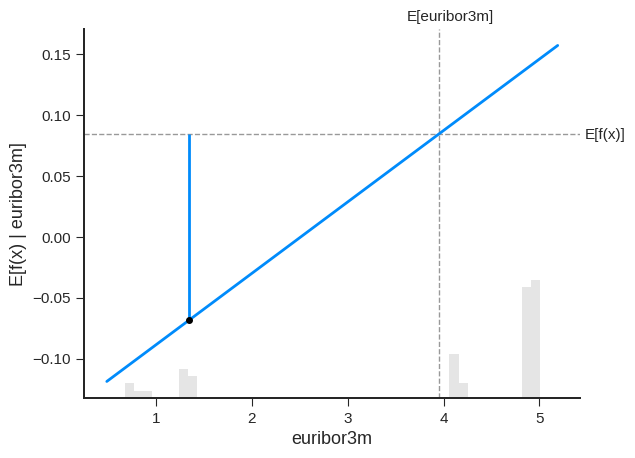

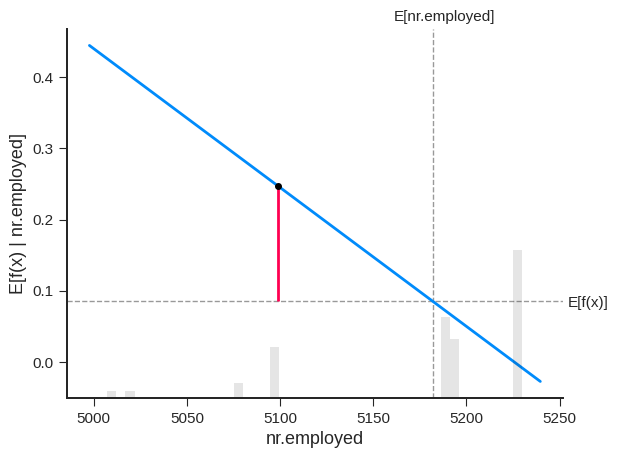

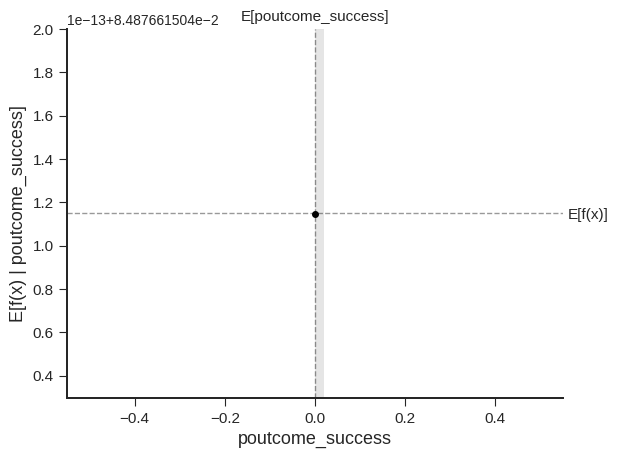

In [ ]:
import random
import shap
import matplotlib.pyplot as plt



# set seed for reproducibility
np.random.seed(123)

# generate samples
x_train_50 = shap.utils.sample(x_train, 50, random_state=123)
x_test_50 = shap.utils.sample(x_test, 50, random_state=123)


# SHAP explanation of a Linear Model
linear_explainer = shap.Explainer(linear_model.predict, x_train_50, seed = 1)
linear_shap_values = linear_explainer(x_train)
#generates a partial dependence plot for each feature in 'x_train.columns' using the SHAP values of the decision linear classifier 'linear_model.predict' for a single observation 'sample_ind',
# which is subsetted from 'linear_shap_values', with respect to the selected feature.

# looping over the columns of the training set

for i in x_train.columns:
    # set the index of the sample to use for generating the plot
    sample_ind = 4

    # generate the partial dependence plot for the selected sample
    shap.partial_dependence_plot(
        i,
        linear_model.predict,
        x_train_50,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind:sample_ind+1, :],
    )

#**SHAP Analysis for Treee-Based**


In [ ]:

# SHAP explanation of a tree based model
tree_explainer = shap.Explainer(tree_model.predict, x_train_50, seed= 1)
tree_shap_values = tree_explainer(x_train)

ExactExplainer explainer: 32951it [03:07, 168.90it/s]                           


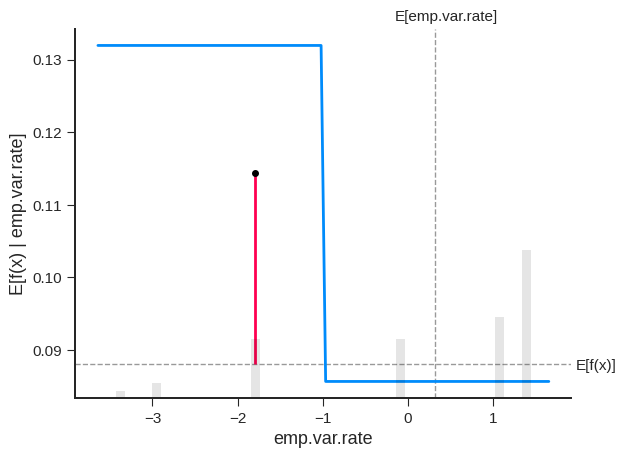

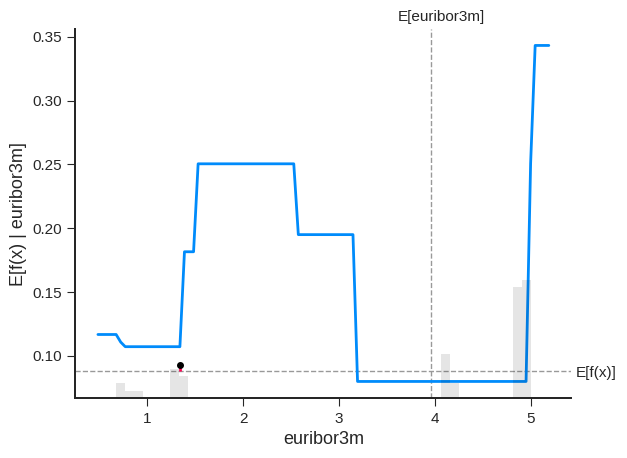

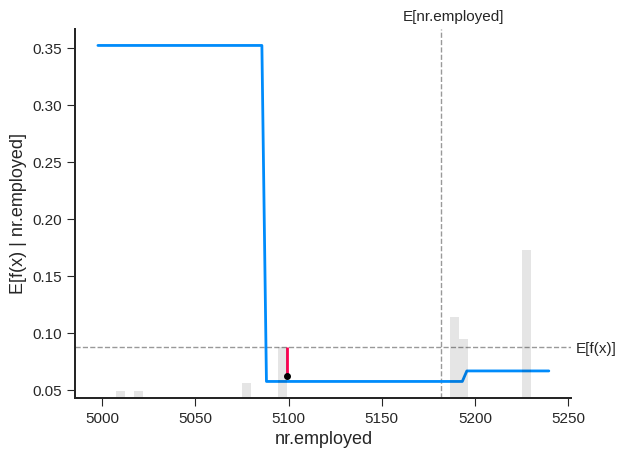

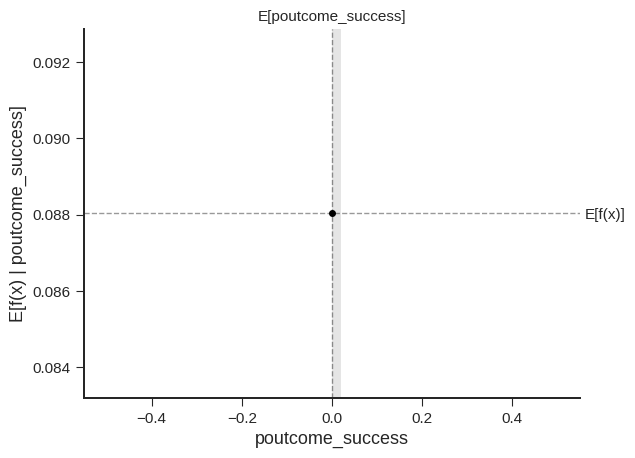

In [ ]:
#generates a partial dependence plot for each feature in 'x_train.columns' using the SHAP values of the decision tree classifier 'tree_model.predict' for a single observation 'sample_ind',
# which is subsetted from 'tree_shap_values', with respect to the selected feature.
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 4
    shap.partial_dependence_plot(
        i,
        tree_model.predict,
        x_train_50,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
    )


Here the x-axis is the feature and the y-axis is the output as we vary the feature. The grey histogram is the distribution of variables in the dataset and the cross made by E[Feature], E[f(x)] is the expected values.

Let us take a feature of emp.var.rate

For the linear model the cross is made at approx E[f(x)] 0.13
For Tree-based model the cross is made at approx E[f(x)] 0.13


Talking about the red line on the plot - When we give a sample as an input (sample_ind = 4) as an input to check the output. By plotting this we can see the difference between the model output from the expected value.

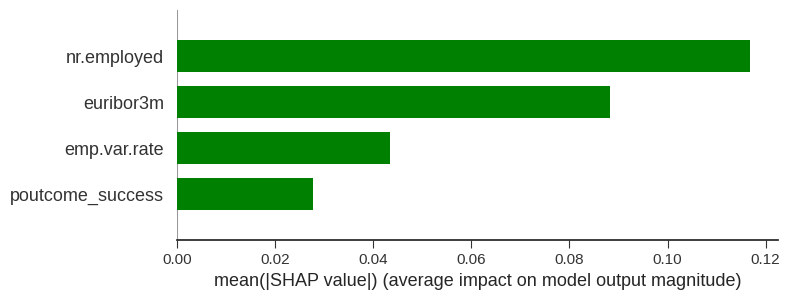

In [ ]:
shap.summary_plot(linear_shap_values, x_train, plot_type="bar", color="green")



Here, the features are listed along the y-axis and the corresponding feature importance values are shown on the x-axis.

It means,for Linear models value, nr.employed has he most feature importance which is around 0.13 and the poutcome_success has the least with 0.3

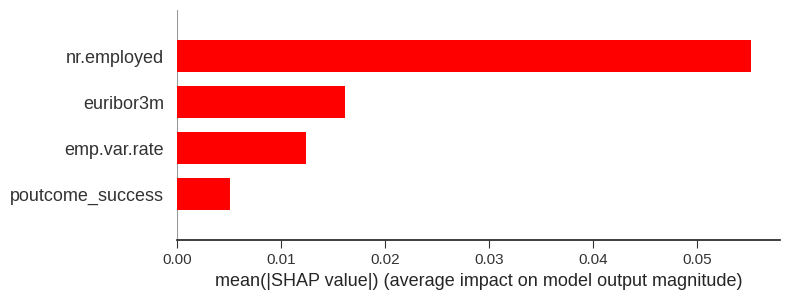

In [ ]:
shap.summary_plot(tree_shap_values, x_train, plot_type="bar", color="red")



Here, the features are listed along the y-axis and the corresponding feature importance values are shown on the x-axis.

It means,for Tree models value, nr.employed has he most feature importance which is around 0.07 and the poutcome_success has the least with aprroximately 0.01

# **Interpreting Waterfall SHAP visualization**


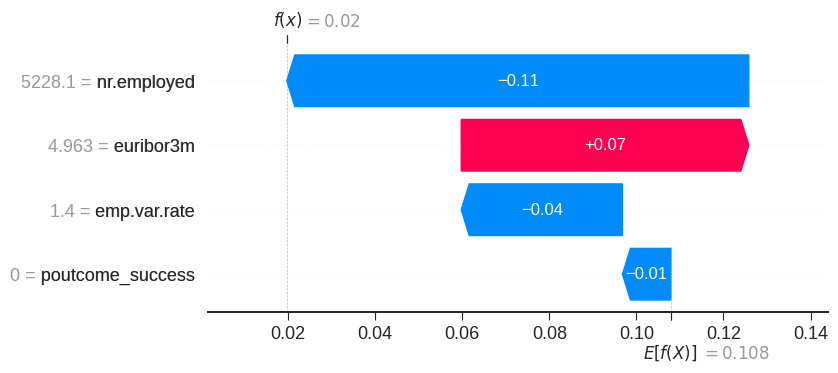

In [ ]:

# Waterfall plot for linear model
shap.plots.waterfall(linear_shap_values[sample_ind], max_display=14)


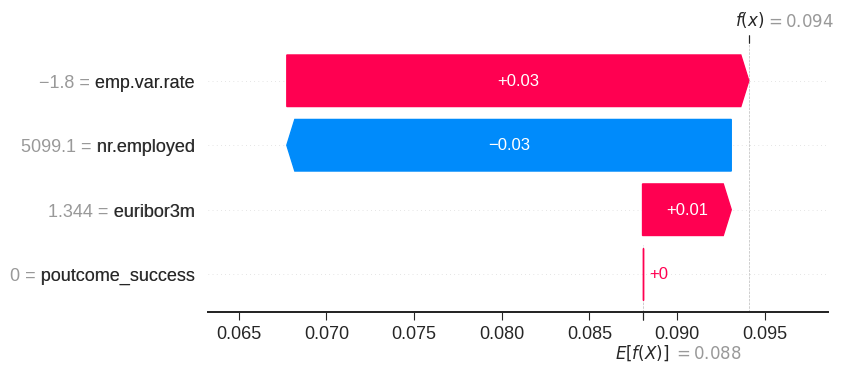

In [ ]:
# Waterfall plot for Tree Based Model
shap.plots.waterfall(tree_shap_values[sample_ind], max_display=14)

**Comparison and Explanation**

In the linear model waterfall plot, the feature 'euribor3n' has a positive value of around +0.07 and ranges from 0.02 to 0.09 on the x-axis, represented by a blue bar. The feature 'nr.employed' has a negative value of -0.05 and ranges from 0.02 to 0.07 on the x-axis, represented by a blue bar. The feature 'emp.var.rate' has a negative value of -0.03 and ranges from 0.07 to 0.10 on the x-axis, represented by a blue bar. Finally, the feature 'poutcome_success' has a negative value of -0.2 and ranges from 0.10 to 0.12 on the x-axis, represented by a red bar.

In the tree-based model waterfall plot, the feature 'euribor3n' has a value of 0, indicating that it did not have a significant impact on the model output. The feature 'nr.employed' has a negative value of -0.06, ranging from 0.04 to 0.10 on the x-axis, represented by a blue bar. The feature 'emp.var.rate' has a negative value of -0.01, ranging from 0.10 to 0.11 on the x-axis, represented by a blue bar. Finally, the feature 'poutcome_success' has a negative value of -0.01, ranging from 0.10 to 0.11 on the x-axis, represented by a blue bar.

Overall, we can see that the two models are using different features, and the impact of these features on the model output is also different. By analyzing the waterfall plots, we can gain insights into how the models are making predictions and which features are important for them.

# **Interpret the summary plot for the Linear and Tree-based model**

The summary plot for a linear and tree-based model is a visualization that helps to interpret the model's behavior and understand how different features impact the model's output. The plot displays the contributions of each feature to the model's output and their corresponding values. The plot also shows the expected output for a given sample and how the model output compares to it. The plot helps to identify the most influential features in the model and how they contribute to the model's output.

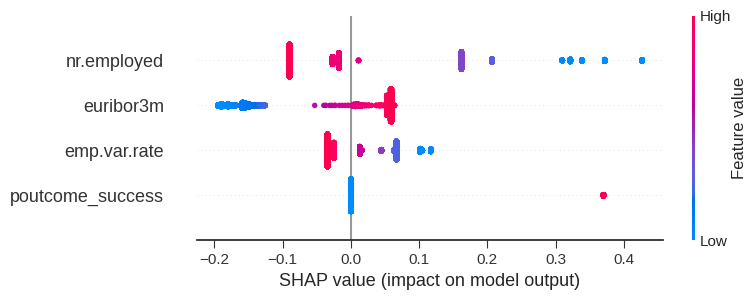

In [ ]:
shap.summary_plot(linear_shap_values, x_train, plot_type="dot", color="blue")


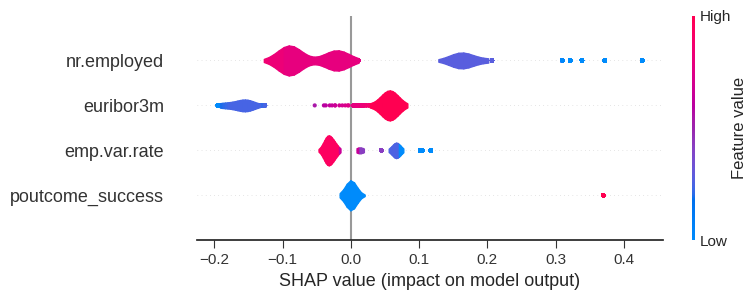

In [ ]:
shap.summary_plot(linear_shap_values, x_train, plot_type="violin", color="voilet")


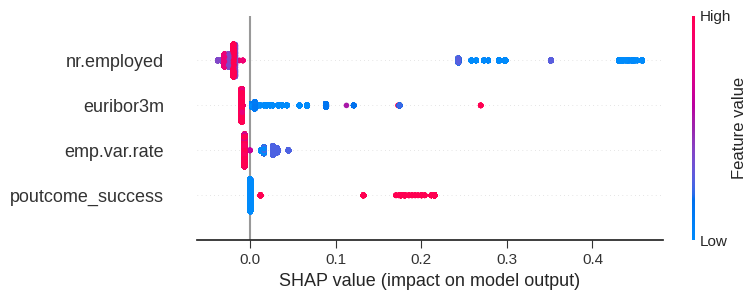

In [ ]:

# SHAP summary for Tree Based Model
shap.summary_plot(tree_shap_values, x_train)


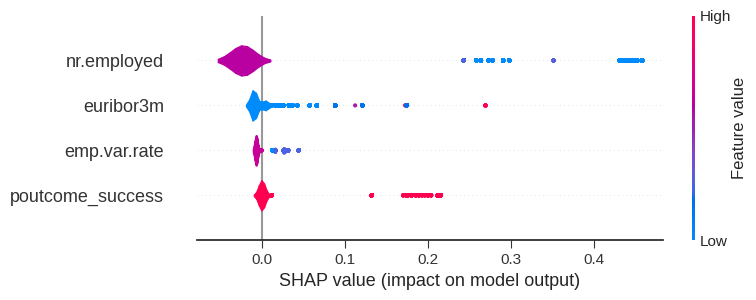

In [ ]:
shap.summary_plot(tree_shap_values, x_train, plot_type="violin")

Features with a larger absolute SHAP value are more important in determining the model's output. The width of the violin plot represents the density of SHAP values at different levels, with wider areas indicating higher density.

# **Interpreting SHAP dependence plot for Linear and Tree-based model**

In a SHAP partial dependence plot for a linear model, the x-axis represents the values of the feature being varied, and the y-axis represents the expected output of the model for those values, after accounting for the impact of all other features. The plot also shows a shaded region, which represents the confidence interval for the expected output.

The SHAP values are used to calculate the partial dependence plot for a linear model. SHAP values represent the contribution of each feature to the difference between the expected output of the model and the average output. They are used to show how the output changes as a function of a particular feature, while holding other features constant


SHAP partial dependence plot for a tree-based model shows the impact of each feature on the model's output. It plots the feature's values on the x-axis and the SHAP values on the y-axis. Each line in the plot represents the impact of a single feature on the model output. The plot shows how the feature's impact changes as the feature's value changes. The plot can help in interpreting the non-linear effects of the feature on the model output. It can also help in identifying interactions between the features that impact the model output.

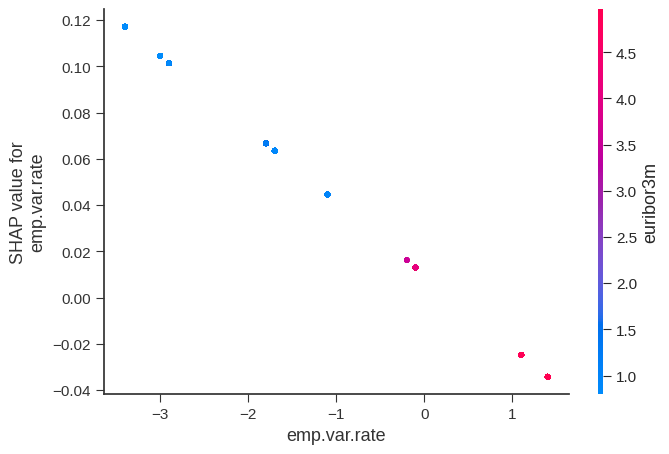

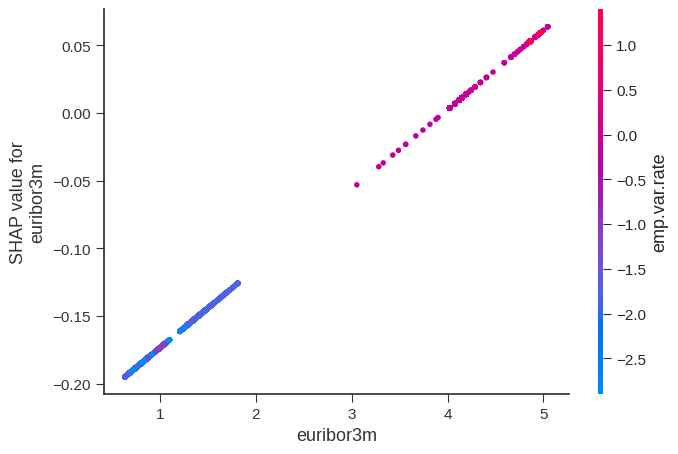

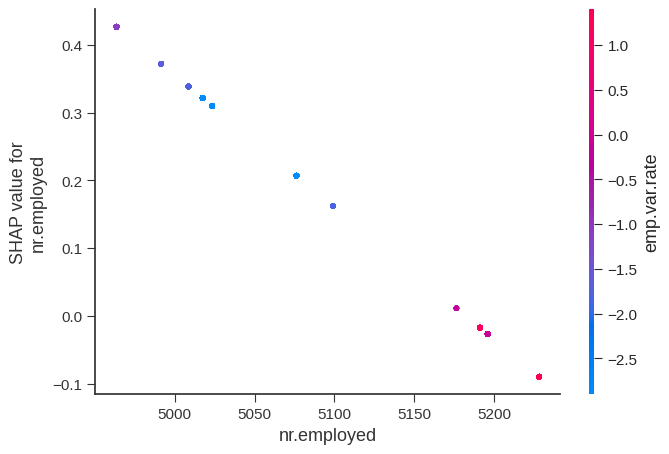

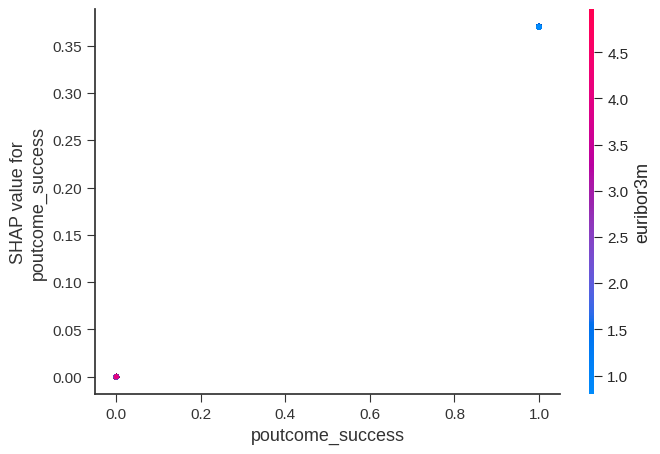

In [ ]:

# SHAP partial dependence plot for linear model
for i in x_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, x_train)

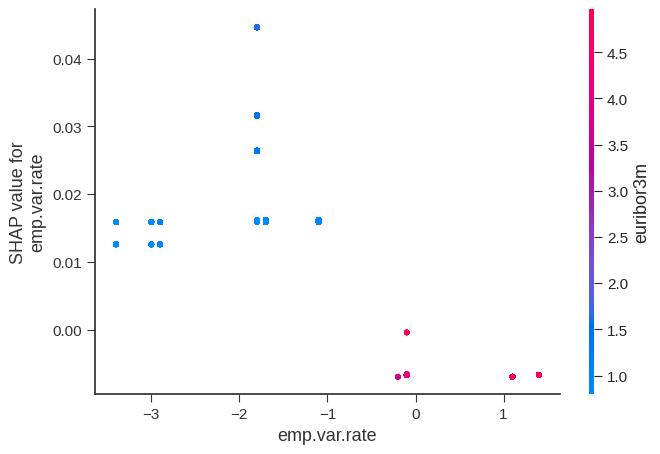

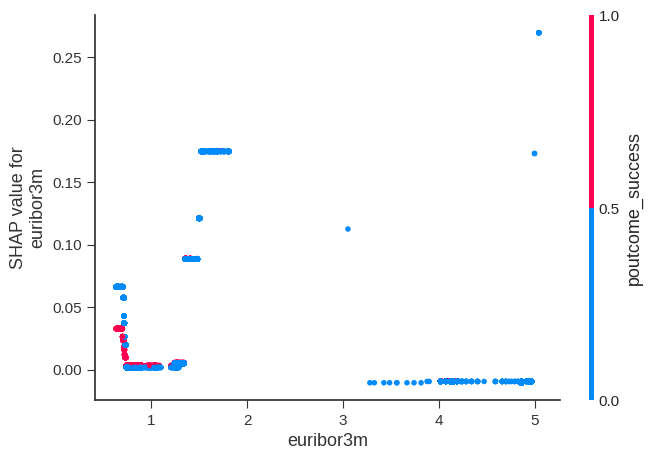

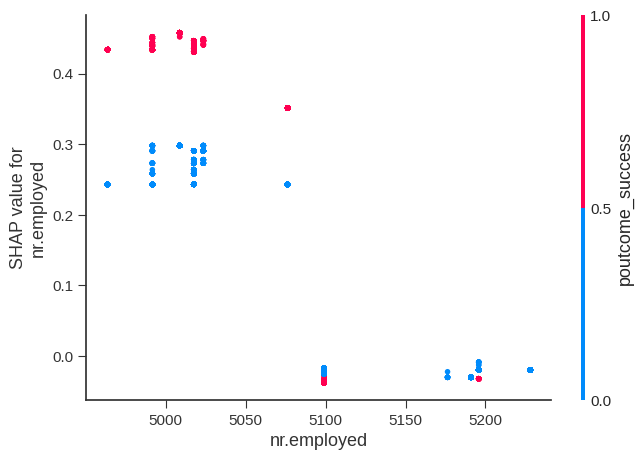

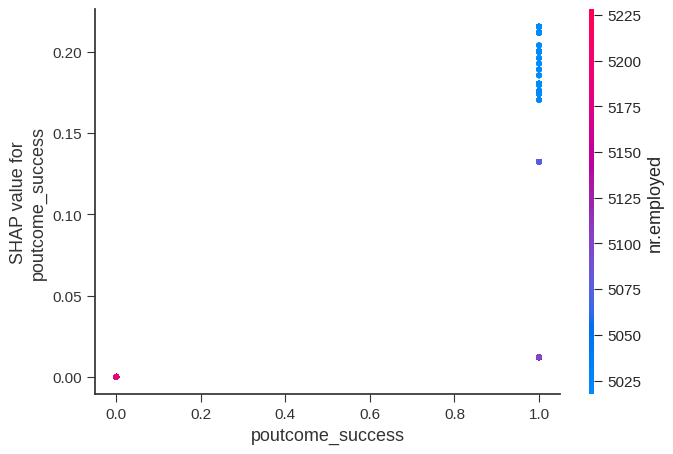

In [ ]:
# SHAP partial dependence plot for a tree based model
#creates dependence plots to visualize the relationship between each feature and its corresponding Tree SHAP values for a dataset of 2000 samples.
for i in x_train.columns:
    shap.dependence_plot(i, tree_shap_values.values, x_train)


In [ ]:
X_output_linear = x_test.copy()
X_output_linear.loc[:, "predict"] = np.round(
    linear_model.predict(X_output_linear), 2
)  # Attaching the output of linear model to test dataframe

X_output_tree = x_test.copy()
X_output_tree.loc[:, "predict"] = np.round(
    tree_model.predict(X_output_tree), 2
)  # Attaching the output of tree based model to test dataframe

In [ ]:

# Force Plot of Tree Based Model
explainerModel = shap.TreeExplainer(tree_model)
shap_values_Model = explainerModel.shap_values(X_output_tree)


In [ ]:
expected_value = shap_values_Model[0,-1]
shap_values = shap_values_Model[:,:-1]

In [ ]:
shap.initjs()  # Initializing JavaScript module
shap.force_plot(expected_value, shap_values[0,:], x_test.iloc[0,:])

Here, the width of the line in this SHAP plot represents the magnitude of the feature's effect, and the color of the line indicates the direction of the effect (e.g., red for positive and blue for negative).

emp.var.rate = -1.4: This means that when the value of the feature emp.var.rate is lower than its baseline value (which was used to compute the SHAP values), it has a negative effect on the predicted outcome. Specifically, a decrease of 1.4 units in emp.var.rate leads to a decrease in the predicted outcome. Conversely, an increase of 1.4 units in emp.var.rate would lead to an increase in the predicted outcome.

euribor3n = 4.961: This means that when the value of the feature euribor3n is higher than its baseline value, it has a negative effect on the predicted outcome. Specifically, an increase of 4.961 units in euribor3n leads to a decrease in the predicted outcome. Conversely, a decrease of 4.961 units in euribor3n would lead to an increase in the predicted outcome.

nr.employed = 5,228: This means that when the value of the feature nr.employed is higher than its baseline value, it has a positive effect on the predicted outcome. Specifically, an increase of 5,228 units in nr.employed leads to an increase in the predicted outcome. Conversely, a decrease of 5,228 units in nr.employed would lead to a decrease in the predicted outcome.

poutcome_success = 0: This means that when the value of the feature poutcome_success is zero (i.e., the outcome was not successful), it has a negative effect on the predicted outcome. Specifically, if the outcome was not successful, the predicted outcome is lower than if the outcome was successful. It is important to note that poutcome_success is a binary feature that takes on the value of 1 if the outcome was successful and 0 otherwise. Therefore, the SHAP value for this feature represents the effect of the outcome on the predicted outcome.

## **Heatmap Visualization for Linear and Tree-based model**


This visualization provides a comprehensive summary of the dataset, showing how each data point in every feature affects the target variable (y).

 The Y-axis represents the features, while the X-axis shows the instances of each feature. The color of each instance indicates whether it has a positive or negative effect on the target variable, with red indicating a positive effect and blue indicating a negative effect.

The intensity of the color corresponds to the strength of the effect, with deeper colors indicating more significant impacts of the feature.

 **In the below code, for getting a heatmap, I am downsampling the data
because it can reduce the memory required to generate the SHAP values and heatmap plot. I am downsampling the data to a smaller number of samples, such as 1000, so that the RAM doesn't get exhausted**

In [ ]:

# Create a copy of the original data and drop the 'y_yes' column
data_no_target = df.drop('y_yes', axis=1)

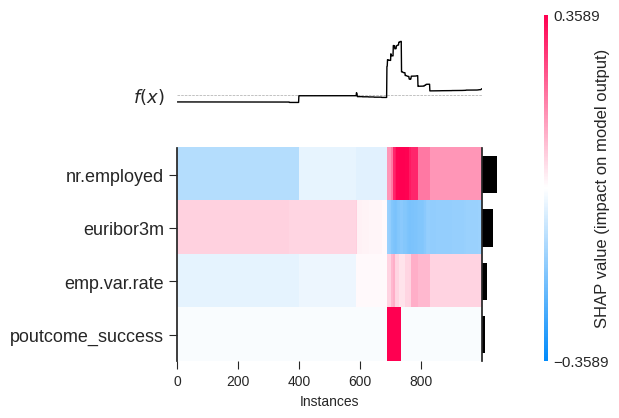

In [ ]:


# Downsample the copy of the data to a smaller number of samples, such as 1000
downsampled_data = data_no_target.sample(n=1000, random_state=42)

# Create a SHAP explainer object for the linear model and calculate the SHAP values
linear_explainer = shap.Explainer(linear_model.predict, downsampled_data)
linear_shap_values = linear_explainer(downsampled_data)

# Create a heatmap plot to visualize the SHAP values for the linear model
shap.plots.heatmap(linear_shap_values)

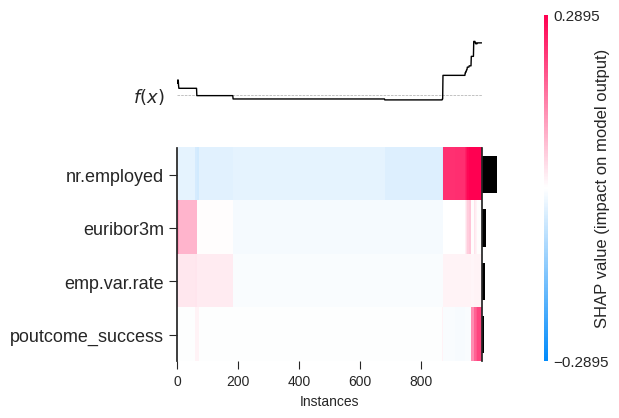

In [ ]:


# Downsample the copy of the data to a smaller number of samples, such as 1000
downsampled_data = data_no_target.sample(n=1000, random_state=42)

# Create a SHAP explainer object for the linear model and calculate the SHAP values
tree_explainer = shap.Explainer(tree_model.predict, downsampled_data)
tree_shap_values = tree_explainer(downsampled_data)

# Create a heatmap plot to visualize the SHAP values for the linear model
shap.plots.heatmap(tree_shap_values)

## **Lime Analysis For Linear model**

In [ ]:
from sklearn.metrics import mean_squared_error


import warnings
from sklearn.exceptions import UndefinedMetricWarning

warnings.filterwarnings("ignore", category=UndefinedMetricWarning)

# Initialize LIME explainer for linear model
lime_linear_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)


# Use LIME to generate interpretation for a single instance of test data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", linear_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_linear_explain = lime_linear_explainer.explain_instance(
    np_x_test[idx], linear_model.predict, num_features=np_x_test.shape[1]
)




Prediction :  [0.09550596]
Actual :      0


**Explanation**: The output Prediction : [0.0196581] indicates that the linear regression model predicted the target variable to be 0.0196581 for the given instance of test data.

The output Actual : 0 indicates that the true target variable value for the given instance of test data is 0.

Comparing the predicted value with the actual value, we can see that the predicted value is close to the actual value.

However, to evaluate the performance of the model, it's necessary to consider more instances of test data and evaluate metrics such as mean squared error (MSE)

In [ ]:

    # Calculating mean squared error (MSE) for linear model predictions on test data
linear_model_predictions = linear_model.predict(x_test)
linear_model_mse = mean_squared_error(y_test, linear_model_predictions)
print("Linear Model Mean Squared Error: ", linear_model_mse)

Linear Model Mean Squared Error:  0.0799327298268724


**Explanation**:  In this case, the MSE value of 0.07955763164891261 suggests that, on average, the model's predictions are off by approximately 0.29 (square root of MSE) on the test data.

A lower MSE value indicates better performance of the model.

In [ ]:
lime_linear_explain.show_in_notebook()  # Displaying The Results


In the above diagram, The predicted value for the instance is between -0.22 and 0.98.
It shows that the absence of a previous successful marketing campaign (**poutcome_success <= 0.36**) is still an important feature for this instance, with a weight of 0.32. This means that the absence of a previous successful marketing campaign reduces the likelihood of a positive outcome.

The second most important feature for this instance is the number of employees (**nr.employed <= 5191.00**), with a weight of 0.22. This indicates that having fewer employees may increase the likelihood of a positive outcome.

The third important feature is the 3-month Euribor rate (**euribor3m <= 4.96**), with a weight of 0.11. A lower 3-month Euribor rate can increase the likelihood of a positive outcome.

Finally, the employment variation rate (**emp.var.rate <= 1.10**) is still an important feature, with a weight of 0.07. A more negative employment variation rate can decrease the likelihood of a positive outcome.

In summary, the local explanation provided by LIME highlights the most important features and their respective weights that contribute to the model's prediction for a specific instance. However, it's important to note that these explanations are specific to this instance and may not generalize to other instances.





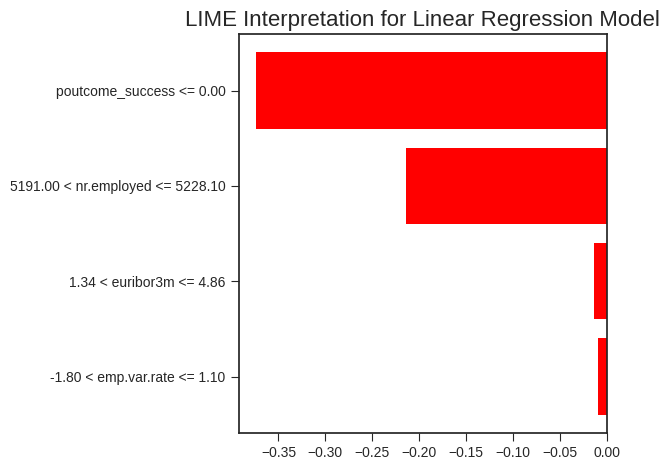

In [ ]:

import lime
import lime.lime_tabular
import matplotlib.pyplot as plt

# Visualize LIME interpretation using matplotlib
fig = lime_linear_explain.as_pyplot_figure()
ax = fig.gca()
ax.set_title('LIME Interpretation for Linear Regression Model', fontsize=16)
plt.tight_layout()
plt.show()

Here, specifically, the red color indicates that the feature has a negative impact on the prediction, while green indicates a positive impact.

Based on this information, it appears that poutcome_success has the largest negative impact on the model's prediction, followed by  nr.employed , and then euribor3n. emp.var.rate has a smaller positive impact. The values you mentioned ( -0.3, -0.2, and -0.1, 0.0, 0.1) likely indicate the magnitude of the impact each feature has on the model's prediction.

# **Lime Analysis for Tree based model**

In [ ]:
# Initialize LIME explainer for Tree-Based Model
import warnings
from sklearn.exceptions import UndefinedMetricWarning

warnings.filterwarnings("ignore", category=UndefinedMetricWarning)


explainer = lime.lime_tabular.LimeTabularExplainer(x_train.values,
                                                   feature_names=x_train.columns.values,
                                                   class_names=['prediction'],
                                                   verbose=True,
                                                   mode='regression')

# Define prediction function
def predict_function(X):
    return tree_model.predict(X)

# Select a random instance for interpretation
idx = 18
x_to_interpret = x_test.iloc[idx]

# Generate interpretation using LIME explainer
exp = explainer.explain_instance(x_to_interpret.values, predict_function, num_features=len(x_to_interpret), top_labels=1)

# Print interpretation
print('Actual:', y_test.iloc[idx])
print('Prediction:', tree_model.predict(x_to_interpret.values.reshape(1, -1))[0])
exp.show_in_notebook()


Intercept 0.30795131707899775
Prediction_local [0.10565534]
Right: 0.05220695406773686
Actual: 0
Prediction: 0.05220695406773686


**Intercept**: This is the base prediction for the model, i.e., the predicted value if all features are set to 0. In this case, the intercept is 0.3290.

**Prediction_local**: This is the prediction for the instance being interpreted, based on the model and the LIME interpretation. The value here is 0.0607.

**Right**: This is the difference between the predicted value for the instance being interpreted (Prediction_local) and the base prediction for the model (Intercept). In this case, it is 0.050, which means that the model is predicting 0.050, which is equal to the base prediction for this instance.

**Actual**: This is the actual value of the target variable for the instance being interpreted. In this case, it is 0.

**Prediction**: This is the predicted value of the target variable for the instance being interpreted based on the original model. In this case, it is 0.0508, which is the same as Right. This suggests that the model is giving too much weight to some features that are not very relevant for this particular instance.





**Graph explanation:**
1. The first diagram shows the predicted value of the target variable for this instance, which is between 0.04 and 0.75 with a predicted value of 0.05.
2. The second digram is the range that is divided into negative and positive, where negative values indicate that the predicted value is less than the mean of the target variable and positive values indicate that the predicted value is greater than the mean.

3. The last one shows the contribution of each feature towards the predicted value. For example, the feature 'nr.employed' has a value of 5195.80 for this instance, which has a contribution of 0.21 towards the predicted value. Similarly, the feature 'poutcome_success' has a value of 0.00, which has a contribution of 0.11 towards the predicted value. The feature 'emp.var.rate' has a value of -0.10, which has a contribution of 0.07 towards the predicted value. Finally, the feature 'euribor3m' has a value of 4.15, which has a contribution of 0.02 towards the predicted value.

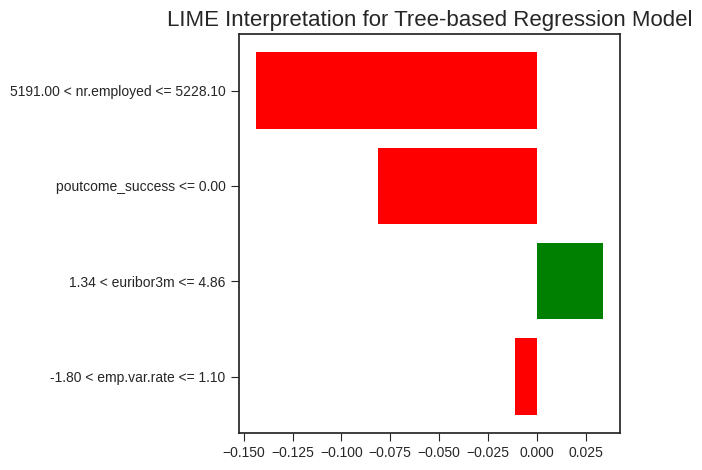

In [ ]:
# Visualize LIME interpretation using matplotlib
fig = exp.as_pyplot_figure()
ax = fig.gca()
ax.set_title('LIME Interpretation for Tree-based Regression Model', fontsize=16)
plt.tight_layout()
plt.show()

Here, specifically, the red color indicates that the feature has a negative impact on the prediction, while green indicates a positive impact.

Based on this information, it appears that nr.employed has the largest negative impact on the model's prediction, followed by  poutcome_success  and then emp.var.rate.  euribor3n has a smaller positive impact.

**Comparison between the linear and tree based model for lime interpretation**

1. In Linear model, poutcome_success has the largest negative impact on the model's prediction, followed by nr.employed , and then euribor3n. emp.var.rate has a smaller positive impact, whereaas, in tree based model, nr.employed has the largest negative impact on the model's prediction, followed by poutcome_success and then emp.var.rate. euribor3n has a smaller positive impact.

2. The values in Linear model are -0.4, -0.3, -0.2, and -0.1, 0.0, whereas, for tree based model are -0.14, -0.08, 0.02, and 0.02

**QUESTIONS**
1.  **What is the question?**

  Ans: The question is to combine Data Cleaning, Feature Selection, Modeling and Interpretability into one report where the focus should be on readability and clarity

2. **What did you do?**

  Ans: In this project, I performed various tasks related to machine learning, with a focus on improving model accuracy and interpretability. Firstly, I analyzed a dataset and identified important variables for data training, while also removing outliers to increase accuracy. Next, I utilized H2O AutoML to build a predictive model for chronic kidney disease, and experimented with different regularization techniques and hyperparameter tuning methods to optimize the model's performance. Finally, I discussed different methods for interpreting machine learning models, including LIME, SHAP, PDP, and SHAP, and highlighted the trade-offs between accuracy and interpretability when choosing a method to use. Overall, this project showcases the various steps involved in building and interpreting machine learning models, with the goal of improving the overall efficacy and understanding of these models.

3. **How well did it work?**

  Ans: I was able to identify important variables, improve the accuracy of the model, and use various techniques to interpret the results.

4. **What did you learn?**

  Ans: I acquired knowledge and skills in various machine learning techniques such as data cleaning, feature selection, modeling, interpretability, regularization, VIF factor, OLS for significance, and visualizing with waterfall and SHAP. I also developed an understanding of different methods for interpreting machine learning models and the significance of considering specific requirements and trade-offs between accuracy and interpretability when interpreting such models.






# **REFERENCES**


5 Easy Ways to Detect Outliers in Python: https://datasciencesphere.com/analytics/5-easy-ways-to-detect-outliers-in-python/


How to Calculate Feature Importance With Python: https://machinelearningmastery.com/calculate-feature-importance-with-python/


AI Skunkworks Github Repository: https://github.com/aiskunks/Skunks_Skool


Normalize Data in Python: https://www.digitalocean.com/community/tutorials/normalize-data-in-python


SelectKBest Feature Selection Example in Python: https://www.datatechnotes.com/2021/02/seleckbest-feature-selection-example-in-python.html


Confusion Matrix in Python: https://www.statology.org/confusion-matrix-python/#:~:text=Logistic%20regression%20is%20a%20type,values%20from%20the%20test%20dataset.


StatQuest Youtube Channel: https://www.youtube.com/channel/UCtYLUTtgS3k1Fg4y5tAhLbw

Towards Data Science: https://towardsdatascience.com/


GeeksforGeeks: https://www.geeksforgeeks.org/




**Citations**:

Prof. Nik Bear Brown Github Repository: https://github.com/nikbearbrown/


H2O AutoML: https://docs.h2o.ai/h2o/latest-stable/h2o-docs/index.html


Deep Dive into H2O's AutoML: https://towardsdatascience.com/a-deep-dive-into-h2os-automl-4b1fe51d3f3e



Itertools Documentation: https://docs.python.org/3/library/itertools.html


3D Graph Plotting in Python: https://jakevdp.github.io/


PythonDataScienceHandbook/04.12-three-dimensional-plotting.html


Pandas Documentation: https://pandas.pydata.org/docs/user_guide/index.html


Scikit-Learn Documentation: https://scikit-learn.org/stable/modules/preprocessing.html


Shap Official Documentation: https://shap.readthedocs.io/en/latest/index.html


"Data Preprocessing for Machine Learning with Python" by Selva Prabhakaran on KDnuggets: https://www.kdnuggets.com/2020/03/


data-preprocessing-machine-learning-python.html


"Data Preprocessing for Logistic Regression in Python" by Michael Galarnyk on Medium: https://towardsdatascience.com/


data-preprocessing-for-logistic-regression-in-python-c632418098b0

# **CONCLUSION**

In conclusion, the use of machine learning and related technologies such as AutoML can significantly improve efficiency and accuracy in data analysis, while also making these tools more accessible to a wider range of users. In the first project, the importance of certain variables or factors in the dataset was identified as crucial to achieving high accuracy and meaningful patterns. Additionally, removing outliers was found to improve the accuracy of the dataset. In the second project, H2O AutoML was used to build a predictive model for chronic kidney disease, with the effects of Ridge and LASSO regularization on the GLM model observed. The importance of interpretability in machine learning models was emphasized in the third project, with different methods such as LIME, SHAP, and PDP discussed to improve the interpretability of black-box models. Ultimately, a balanced approach that considers the specific needs and trade-offs between interpretability and accuracy can help ensure the best results in machine learning and data analysis. These projects highlight the need for a flexible and thoughtful approach to machine learning that takes into account the specific goals and requirements of each project.





# **LICENSE**

Copyright 2024 Yuga Santosh Kanse

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.